In [ ]:
# --- Step 1. Upload the file manually ---
from google.colab import files
uploaded = files.upload()   # ⬅️ this opens a file-picker; select corporate_ratings_data.csv

# --- Step 2. Load into pandas ---
import pandas as pd
df_corp = pd.read_csv("corporate_ratings_data.csv")

# --- Step 3. Quick check ---
print(df_corp.shape)
df_corp.head()


Saving corporate_ratings_data.csv to corporate_ratings_data.csv
(2027, 32)


,Rating,Name,Symbol,Rating Agency Name,Date,Year,Sector,currentRatio,quickRatio,cashRatio,...,effectiveTaxRate,freeCashFlowOperatingCashFlowRatio,freeCashFlowPerShare,cashPerShare,companyEquityMultiplier,ebitPerRevenue,enterpriseValueMultiple,operatingCashFlowPerShare,operatingCashFlowSalesRatio,payablesTurnover
0,BBB,Pitney Bowes Inc.,PBI,Standard & Poor's Ratings Services,9/30/2010,2010,Miscellaneous,1.178049,0.511873,0.189680,...,0.384921,0.874208,4.041128e+00,2.500252e+00,-87.429443,0.098535,10.455327,4.622616e+00,0.175496,0.077504
1,BB,Jabil Inc.,JBL,Standard & Poor's Ratings Services,11/3/2010,2010,Technology,1.290927,0.597100,0.206461,...,0.309386,0.067815,1.352341e-01,3.472785e+00,4.035210,0.018440,4.386228,1.994149e+00,0.031874,4.524631
2,CCC,Tenet Healthcare Corporation,THC,Standard & Poor's Ratings Services,8/3/2010,2010,Health Care,1.339710,1.082319,0.234783,...,-6.183544,1.000000,9.745603e-01,1.494876e+00,4.813137,0.017165,15.656926,9.745603e-01,0.051276,0.000000
3,BBB,Carpenter Technology Corporation,CRS,Standard & Poor's Ratings Services,12/20/2010,2010,Basic Industries,3.761468,2.559633,1.215596,...,0.500000,0.617391,1.651163e+00,8.604651e+00,2.762653,0.003339,21.383571,2.674419e+00,0.095993,8.100000
4,BBB,Biogen Inc.,BIIB,Standard & Poor's Ratings Services,12/22/2010,2010,Health Care,2.419167,1.726536,0.723343,...,0.269397,0.893483,5.753380e+06,4.786803e+06,1.499580,0.260771,0.027133,6.439270e+06,0.344471,2.462711


In [ ]:
df_corp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2027 entries, 0 to 2026
Data columns (total 32 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Rating                              2027 non-null   object 
 1   Name                                2027 non-null   object 
 2   Symbol                              2027 non-null   object 
 3   Rating Agency Name                  2027 non-null   object 
 4   Date                                2027 non-null   object 
 5   Year                                2027 non-null   int64  
 6   Sector                              2027 non-null   object 
 7   currentRatio                        2027 non-null   float64
 8   quickRatio                          2027 non-null   float64
 9   cashRatio                           2027 non-null   float64
 10  daysOfSalesOutstanding              2027 non-null   float64
 11  netProfitMargin                     2027 no

## 6 categorical variables, 26 numerical variables, no missing values

Rating
BBB    671
BB     489
A      398
B      302
AA      88
CCC     64
AAA      7
CC       5
C        2
D        1
Name: count, dtype: int64


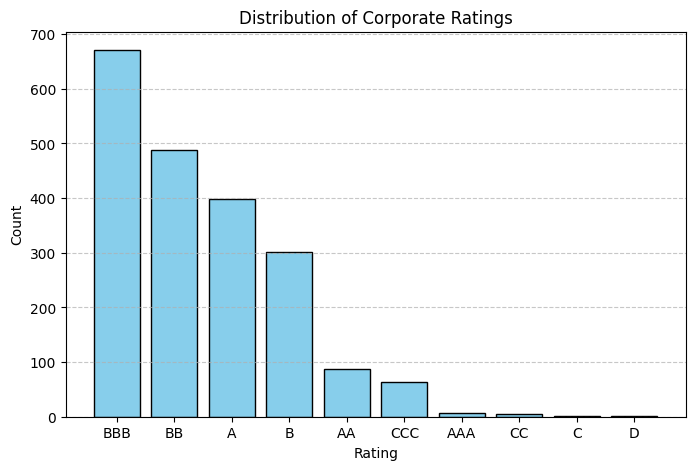

In [ ]:
print(df_corp.Rating.value_counts())
import matplotlib.pyplot as plt
import seaborn as sns

# Count the number of each rating
rating_counts = df_corp['Rating'].value_counts()

plt.figure(figsize=(8, 5))
plt.bar(rating_counts.index, rating_counts.values, color='skyblue', edgecolor='black')
plt.title("Distribution of Corporate Ratings")
plt.xlabel("Rating")
plt.ylabel("Count")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



## Objective variable is not balanced, and some grades with small samples, should be rebuilt.

Risk Level Distribution:
Risk_Level
High Risk        791
Medium Risk      671
Low Risk         398
Very Low Risk     95
Highest Risk      72
Name: count, dtype: int64


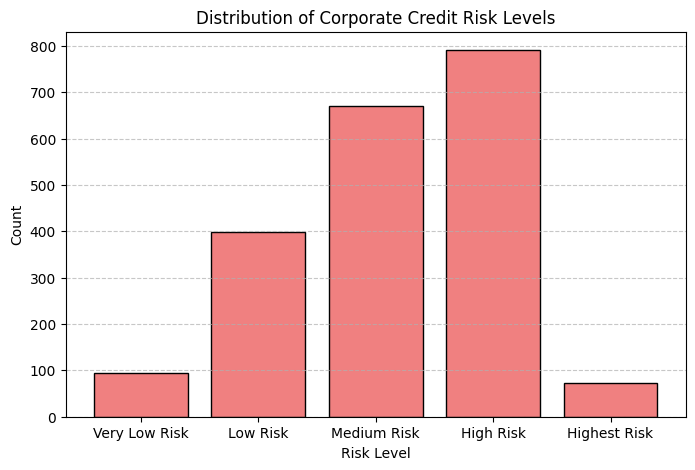


Ordinal numeric encoding (correct order):
{'Highest Risk': 0, 'High Risk': 1, 'Medium Risk': 2, 'Low Risk': 3, 'Very Low Risk': 4}


,Rating,Rating_grouped,Risk_Level,Risk_Level_num
0,BBB,BBB,Medium Risk,2
1,BB,BB&B,High Risk,1
2,CCC,C&CC&CCC&D,Highest Risk,0
3,BBB,BBB,Medium Risk,2
4,BBB,BBB,Medium Risk,2


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------------------------
# 1️⃣ Duplicate your current DataFrame to preserve original data
# -----------------------------------------------
df_risk = df_corp.copy()

# -----------------------------------------------
# 2️⃣ Map each original rating to a grouped category
# -----------------------------------------------
rating_map = {
    'AAA': 'AAA&AA',
    'AA': 'AAA&AA',
    'A': 'A',
    'BBB': 'BBB',
    'BB': 'BB&B',
    'B': 'BB&B',
    'CCC': 'C&CC&CCC&D',
    'CC': 'C&CC&CCC&D',
    'C': 'C&CC&CCC&D',
    'D': 'C&CC&CCC&D'
}
df_risk['Rating_grouped'] = df_risk['Rating'].map(rating_map)

# -----------------------------------------------
# 3️⃣ Map grouped ratings to risk levels
# -----------------------------------------------
risk_map = {
    'AAA&AA': 'Very Low Risk',
    'A': 'Low Risk',
    'BBB': 'Medium Risk',
    'BB&B': 'High Risk',
    'C&CC&CCC&D': 'Highest Risk'
}
df_risk['Risk_Level'] = df_risk['Rating_grouped'].map(risk_map)

# -----------------------------------------------
# 4️⃣ Check the new distribution
# -----------------------------------------------
print("Risk Level Distribution:")
print(df_risk['Risk_Level'].value_counts())

# -----------------------------------------------
# 5️⃣ Plot the distribution
# -----------------------------------------------
plt.figure(figsize=(8,5))
risk_counts = df_risk['Risk_Level'].value_counts().reindex(
    ['Very Low Risk', 'Low Risk', 'Medium Risk', 'High Risk', 'Highest Risk']
)
plt.bar(risk_counts.index, risk_counts.values, color='lightcoral', edgecolor='black')
plt.title('Distribution of Corporate Credit Risk Levels')
plt.xlabel('Risk Level')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# -----------------------------------------------
# 6️⃣ Encode numeric labels (manual ordinal mapping)
# -----------------------------------------------
# Higher number = safer rating (1 = highest risk → 5 = safest)
risk_order = {
    'Highest Risk': 0,
    'High Risk': 1,
    'Medium Risk': 2,
    'Low Risk': 3,
    'Very Low Risk': 4
}
df_risk['Risk_Level_num'] = df_risk['Risk_Level'].map(risk_order)

# Display mapping and sample
print("\nOrdinal numeric encoding (correct order):")
print(risk_order)

df_risk[['Rating', 'Rating_grouped', 'Risk_Level', 'Risk_Level_num']].head()


## Now the objective variable is more balanced

🔹 Rating Agency vs Risk Level
Risk_Level                          High Risk  Highest Risk  Low Risk  \
Rating Agency Name                                                      
DBRS                                        0             0         0   
Egan-Jones Ratings Company                146            12       209   
Fitch Ratings                              29             3        17   
Moody's Investors Service                 189            35       105   
Standard & Poor's Ratings Services        427            22        67   

Risk_Level                          Medium Risk  Very Low Risk  
Rating Agency Name                                              
DBRS                                          1              1  
Egan-Jones Ratings Company                  168             68  
Fitch Ratings                                48              3  
Moody's Investors Service                   243              7  
Standard & Poor's Ratings Services          211             16  

🔹 

<Figure size 1000x600 with 0 Axes>

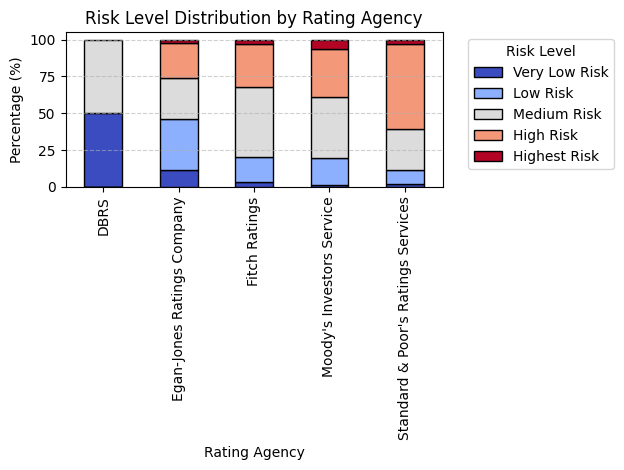

<Figure size 1200x600 with 0 Axes>

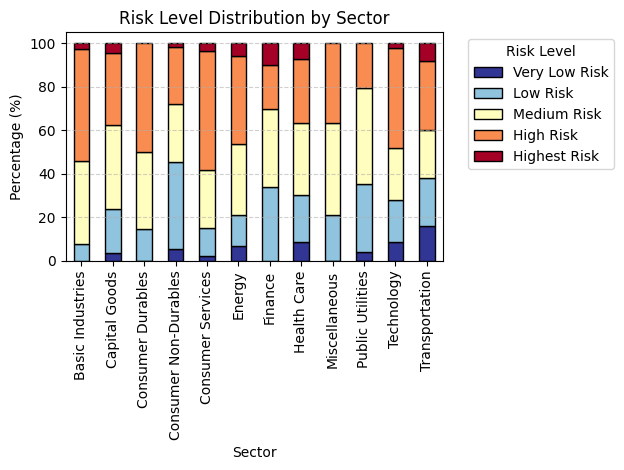

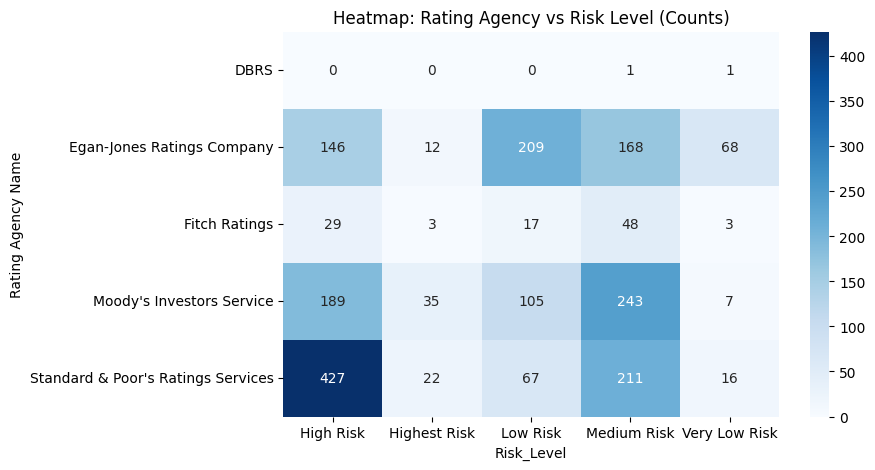

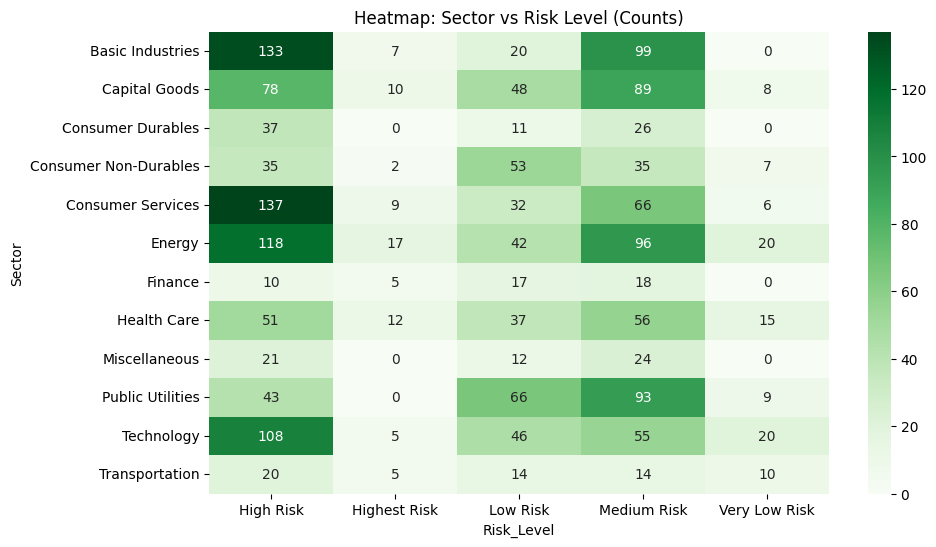

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------
# 1️⃣ Basic cross-tabulation counts
# -----------------------------------------------
# Agency vs Risk
agency_risk_ct = pd.crosstab(df_risk['Rating Agency Name'], df_risk['Risk_Level'])
print("🔹 Rating Agency vs Risk Level")
print(agency_risk_ct)

# Sector vs Risk
sector_risk_ct = pd.crosstab(df_risk['Sector'], df_risk['Risk_Level'])
print("\n🔹 Sector vs Risk Level")
print(sector_risk_ct)

# -----------------------------------------------
# 2️⃣ Normalize (percent within each category)
# -----------------------------------------------
agency_risk_pct = agency_risk_ct.div(agency_risk_ct.sum(axis=1), axis=0) * 100
sector_risk_pct = sector_risk_ct.div(sector_risk_ct.sum(axis=1), axis=0) * 100

# -----------------------------------------------
# 3️⃣ Plot — Rating Agency vs Risk Level
# -----------------------------------------------
plt.figure(figsize=(10,6))
agency_risk_pct.loc[:, ['Very Low Risk','Low Risk','Medium Risk','High Risk','Highest Risk']].plot(
    kind='bar', stacked=True, colormap='coolwarm', edgecolor='black'
)
plt.title('Risk Level Distribution by Rating Agency')
plt.xlabel('Rating Agency')
plt.ylabel('Percentage (%)')
plt.legend(title='Risk Level', bbox_to_anchor=(1.05,1))
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# -----------------------------------------------
# 4️⃣ Plot — Sector vs Risk Level
# -----------------------------------------------
plt.figure(figsize=(12,6))
sector_risk_pct.loc[:, ['Very Low Risk','Low Risk','Medium Risk','High Risk','Highest Risk']].plot(
    kind='bar', stacked=True, colormap='RdYlBu_r', edgecolor='black'
)
plt.title('Risk Level Distribution by Sector')
plt.xlabel('Sector')
plt.ylabel('Percentage (%)')
plt.legend(title='Risk Level', bbox_to_anchor=(1.05,1))
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# -----------------------------------------------
# 5️⃣ Optional — Heatmaps (absolute count relationships)
# -----------------------------------------------
plt.figure(figsize=(8,5))
sns.heatmap(agency_risk_ct, annot=True, fmt='d', cmap='Blues')
plt.title('Heatmap: Rating Agency vs Risk Level (Counts)')
plt.show()

plt.figure(figsize=(10,6))
sns.heatmap(sector_risk_ct, annot=True, fmt='d', cmap='Greens')
plt.title('Heatmap: Sector vs Risk Level (Counts)')
plt.show()


## The categorical variabls show very clear distribution difference across different ratings (risks), considering one-hot encoding for these two variables

In [ ]:
import pandas as pd

# -----------------------------------------------
# One-hot encode the two categorical variables
# -----------------------------------------------
categorical_cols = ['Rating Agency Name', 'Sector']
df_encoded = pd.get_dummies(df_risk, columns=categorical_cols, drop_first=True)

# -----------------------------------------------
# Convert only dummy columns (bool) to integers
# -----------------------------------------------
bool_cols = df_encoded.select_dtypes(include=['bool']).columns
df_encoded[bool_cols] = df_encoded[bool_cols].astype(int)

# -----------------------------------------------
# Check results
# -----------------------------------------------
print(f"✅ One-hot encoding complete. Converted {len(bool_cols)} boolean columns to 0/1 integers.")
print("Example dummy columns:")
print([col for col in df_encoded.columns if 'Rating Agency Name' in col or 'Sector' in col][:10])

df_encoded.head()


✅ One-hot encoding complete. Converted 15 boolean columns to 0/1 integers.
Example dummy columns:
['Rating Agency Name_Egan-Jones Ratings Company', 'Rating Agency Name_Fitch Ratings', "Rating Agency Name_Moody's Investors Service", "Rating Agency Name_Standard & Poor's Ratings Services", 'Sector_Capital Goods', 'Sector_Consumer Durables', 'Sector_Consumer Non-Durables', 'Sector_Consumer Services', 'Sector_Energy', 'Sector_Finance']


,Rating,Name,Symbol,Date,Year,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,netProfitMargin,...,Sector_Consumer Durables,Sector_Consumer Non-Durables,Sector_Consumer Services,Sector_Energy,Sector_Finance,Sector_Health Care,Sector_Miscellaneous,Sector_Public Utilities,Sector_Technology,Sector_Transportation
0,BBB,Pitney Bowes Inc.,PBI,9/30/2010,2010,1.178049,0.511873,0.189680,53.293224,0.053892,...,0,0,0,0,0,0,1,0,0,0
1,BB,Jabil Inc.,JBL,11/3/2010,2010,1.290927,0.597100,0.206461,38.334006,0.012735,...,0,0,0,0,0,0,0,0,1,0
2,CCC,Tenet Healthcare Corporation,THC,8/3/2010,2010,1.339710,1.082319,0.234783,45.322651,0.121564,...,0,0,0,0,0,1,0,0,0,0
3,BBB,Carpenter Technology Corporation,CRS,12/20/2010,2010,3.761468,2.559633,1.215596,57.278798,0.001669,...,0,0,0,0,0,0,0,0,0,0
4,BBB,Biogen Inc.,BIIB,12/22/2010,2010,2.419167,1.726536,0.723343,46.845901,0.190520,...,0,0,0,0,0,1,0,0,0,0


## work on numerical variables

Summary Statistics:


,count,mean,std,min,25%,50%,75%,max
Year,2027.0,2014.049334,1.505676,2010.000000,2013.000000,2014.000000,2015.000000,2.016000e+03
currentRatio,2027.0,3.531636,44.074048,-0.932005,1.072681,1.493338,2.168074,1.725505e+03
quickRatio,2027.0,2.656079,32.961006,-1.893266,0.603217,0.986441,1.453859,1.139542e+03
cashRatio,2027.0,0.667823,3.585682,-0.192736,0.130603,0.297654,0.625130,1.259174e+02
daysOfSalesOutstanding,2027.0,334.106808,4450.023339,-811.845623,22.924947,42.377182,59.336644,1.159616e+05
netProfitMargin,2027.0,0.278629,6.067124,-101.845815,0.020956,0.064691,0.114811,1.985179e+02
pretaxProfitMargin,2027.0,0.431749,8.989412,-124.343612,0.025578,0.084913,0.144713,3.096949e+02
grossProfitMargin,2027.0,0.497906,0.525381,-14.800817,0.233346,0.414774,0.848072,2.702533e+00
operatingProfitMargin,2027.0,0.587740,11.230153,-124.343612,0.044578,0.107729,0.176140,4.101822e+02
returnOnAssets,2027.0,-37.555082,1166.747081,-40213.178290,0.019024,0.045605,0.077403,4.878257e-01



Skewness of numerical variables:


,0
currentRatio,34.321968
cashPerShare,34.009070
freeCashFlowPerShare,33.660587
effectiveTaxRate,32.292803
returnOnEquity,31.686848
quickRatio,30.910417
operatingCashFlowPerShare,30.337926
cashRatio,27.085736
operatingProfitMargin,26.480795
fixedAssetTurnover,26.107543


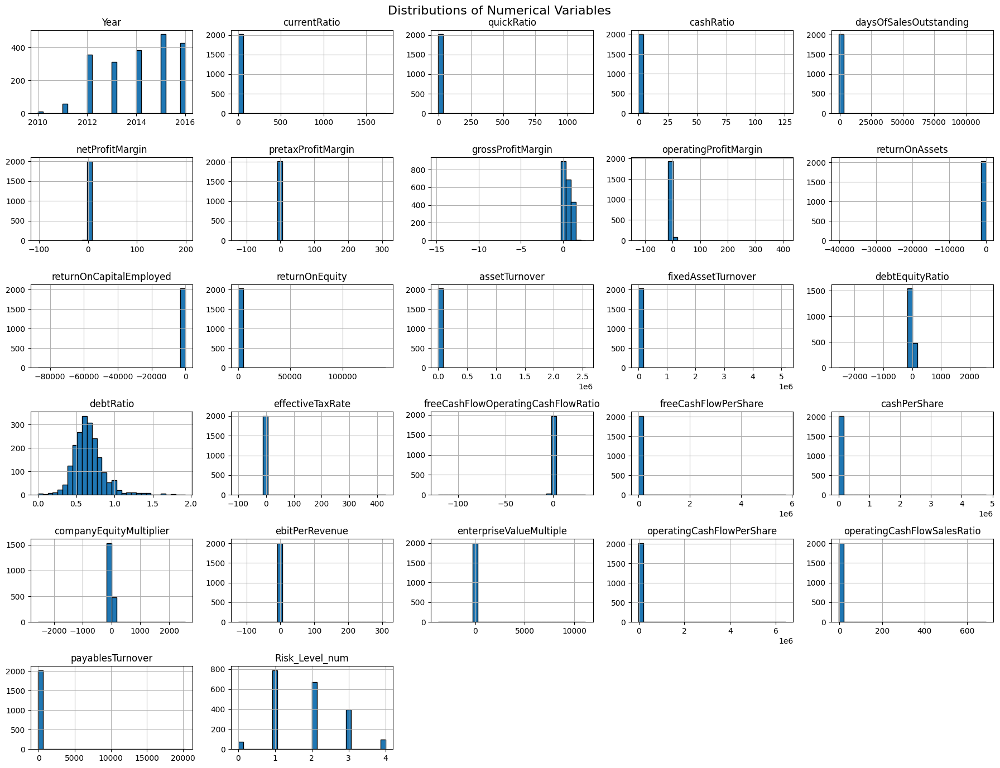

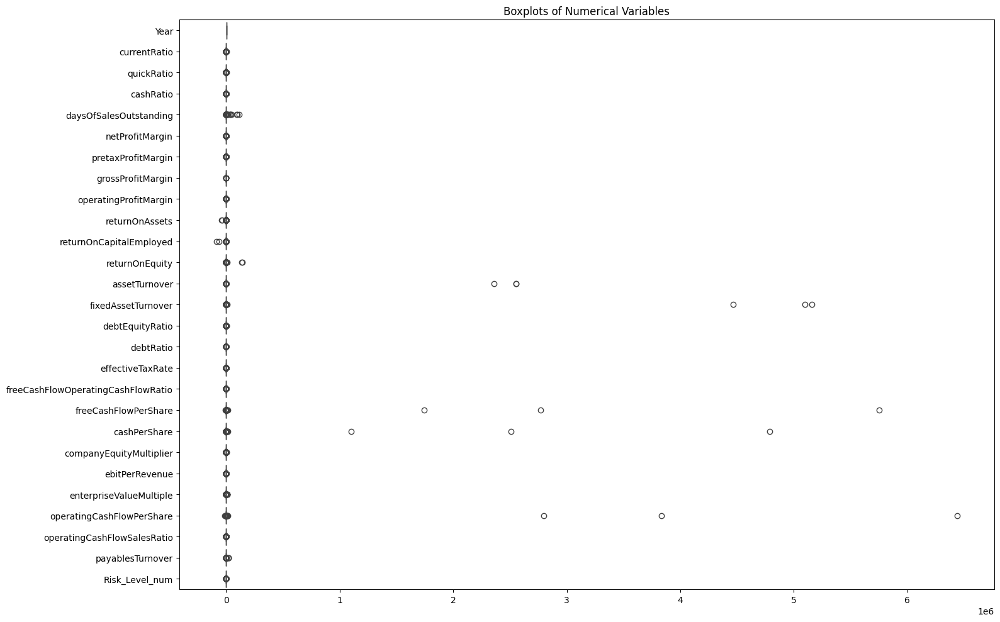

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numeric columns (float or int)
num_cols = df_risk.select_dtypes(include=['float64','int64']).columns

# -----------------------------------------------
# 1️⃣ Summary statistics
# -----------------------------------------------
print("Summary Statistics:")
display(df_risk[num_cols].describe().T)

# -----------------------------------------------
# 2️⃣ Skewness check
# -----------------------------------------------
print("\nSkewness of numerical variables:")
display(df_risk[num_cols].skew().sort_values(ascending=False))

# -----------------------------------------------
# 3️⃣ Histograms (distribution visualization)
# -----------------------------------------------
df_risk[num_cols].hist(figsize=(18,14), bins=30, edgecolor='black')
plt.suptitle("Distributions of Numerical Variables", fontsize=16)
plt.tight_layout()
plt.show()

# -----------------------------------------------
# 4️⃣ Boxplots (for outlier detection)
# -----------------------------------------------
plt.figure(figsize=(16, 10))
sns.boxplot(data=df_risk[num_cols], orient='h')
plt.title("Boxplots of Numerical Variables")
plt.tight_layout()
plt.show()


## Signs of high skewness and many outliers

Numeric variables to check (25 columns):
['currentRatio', 'quickRatio', 'cashRatio', 'daysOfSalesOutstanding', 'netProfitMargin', 'pretaxProfitMargin', 'grossProfitMargin', 'operatingProfitMargin', 'returnOnAssets', 'returnOnCapitalEmployed', 'returnOnEquity', 'assetTurnover', 'fixedAssetTurnover', 'debtEquityRatio', 'debtRatio', 'effectiveTaxRate', 'freeCashFlowOperatingCashFlowRatio', 'freeCashFlowPerShare', 'cashPerShare', 'companyEquityMultiplier', 'ebitPerRevenue', 'enterpriseValueMultiple', 'operatingCashFlowPerShare', 'operatingCashFlowSalesRatio', 'payablesTurnover']

📊 Outlier Percentage per Numeric Variable:


,Variable,Outlier_Percentage
10,returnOnEquity,15.441539
13,debtEquityRatio,13.862852
19,companyEquityMultiplier,13.665516
15,effectiveTaxRate,12.037494
5,pretaxProfitMargin,11.642822
4,netProfitMargin,11.445486
20,ebitPerRevenue,11.100148
21,enterpriseValueMultiple,11.050814
18,cashPerShare,10.113468
17,freeCashFlowPerShare,9.965466


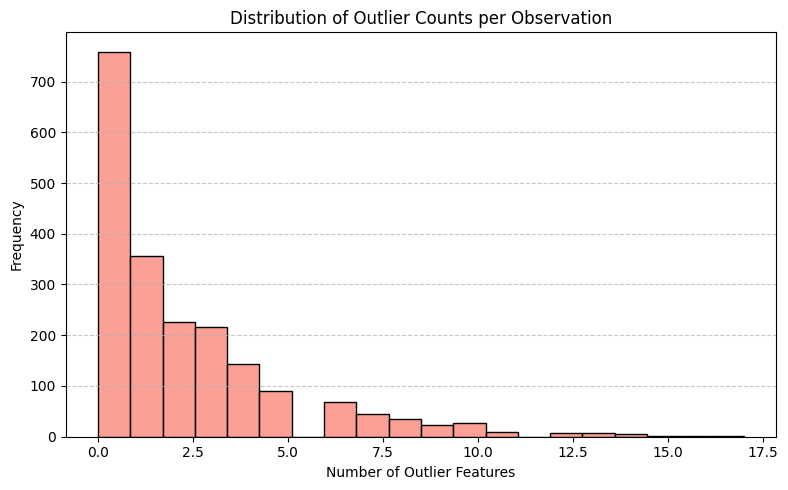


Average number of outlier features per row: 2.17


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------
# 1️⃣ Select numeric columns, excluding Year and Risk_Level_num
# -----------------------------------------------
num_cols = df_risk.select_dtypes(include=['float64','int64']).columns
num_cols = [c for c in num_cols if c not in ['Year', 'Risk_Level_num']]

print(f"Numeric variables to check ({len(num_cols)} columns):")
print(num_cols)

# -----------------------------------------------
# 2️⃣ Create empty DataFrame to store outlier flags (1/0)
# -----------------------------------------------
df_rating_outlier = pd.DataFrame(0, index=df_risk.index, columns=num_cols)

# -----------------------------------------------
# 3️⃣ Identify outliers using 1.5 * IQR rule for each variable
# -----------------------------------------------
outlier_summary = []

for col in num_cols:
    Q1 = df_risk[col].quantile(0.25)
    Q3 = df_risk[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Flag outliers
    df_rating_outlier[col] = ((df_risk[col] < lower) | (df_risk[col] > upper)).astype(int)

    # Calculate outlier percentage
    outlier_pct = df_rating_outlier[col].mean() * 100
    outlier_summary.append((col, outlier_pct))

# -----------------------------------------------
# 4️⃣ Summary table of outlier percentages
# -----------------------------------------------
outlier_summary_df = pd.DataFrame(outlier_summary, columns=['Variable','Outlier_Percentage']).sort_values(by='Outlier_Percentage', ascending=False)
print("\n📊 Outlier Percentage per Numeric Variable:")
display(outlier_summary_df)

# -----------------------------------------------
# 5️⃣ Count outliers per row
# -----------------------------------------------
df_rating_outlier['Total_Outliers'] = df_rating_outlier.sum(axis=1)

# -----------------------------------------------
# 6️⃣ Plot: distribution of number of outliers per row
# -----------------------------------------------
plt.figure(figsize=(8,5))
sns.histplot(df_rating_outlier['Total_Outliers'], bins=20, kde=False, color='salmon', edgecolor='black')
plt.title('Distribution of Outlier Counts per Observation')
plt.xlabel('Number of Outlier Features')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# -----------------------------------------------
# 7️⃣ Optional quick check
# -----------------------------------------------
print(f"\nAverage number of outlier features per row: {df_rating_outlier['Total_Outliers'].mean():.2f}")


## Many outliers, few rows have no outliers, no value in excluding the outliers from the dataset

## Deal with outliers to observe numerical variables more clear

✅ Outliers replaced with ±1.5×IQR threshold limits.
Updated numeric variables: 25 columns


/tmp/ipython-input-3519840038.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y='currentRatio', palette='coolwarm', order=['Highest Risk', 'High Risk', 'Medium Risk', 'Low Risk', 'Very Low Risk'])


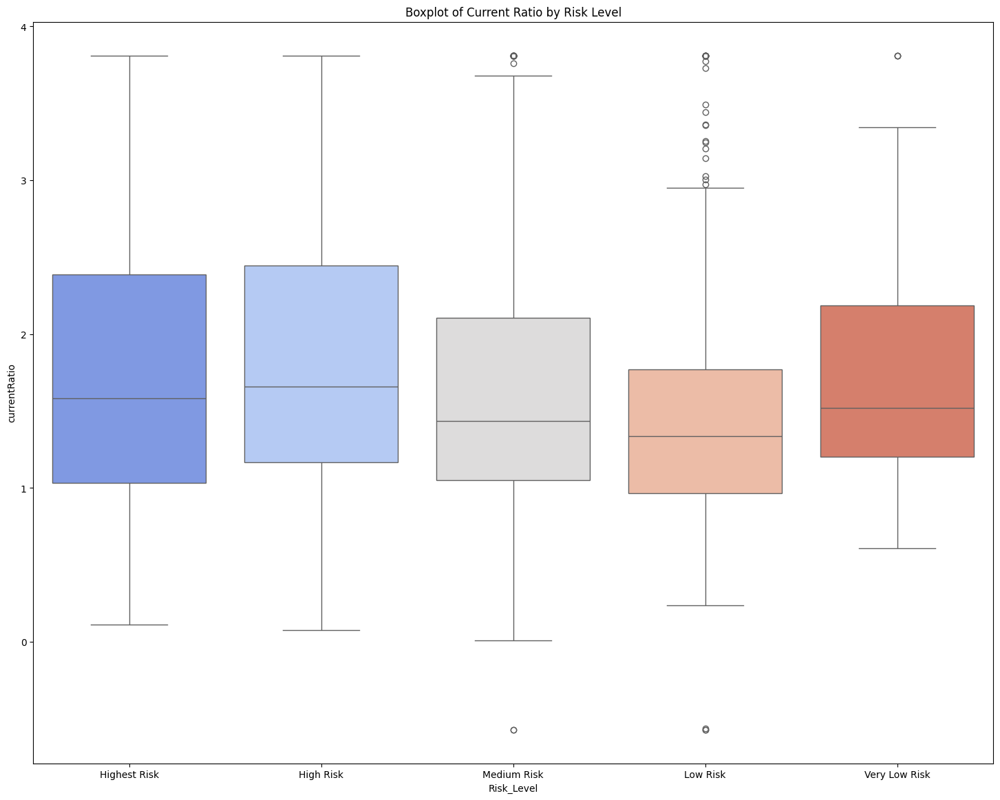

/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

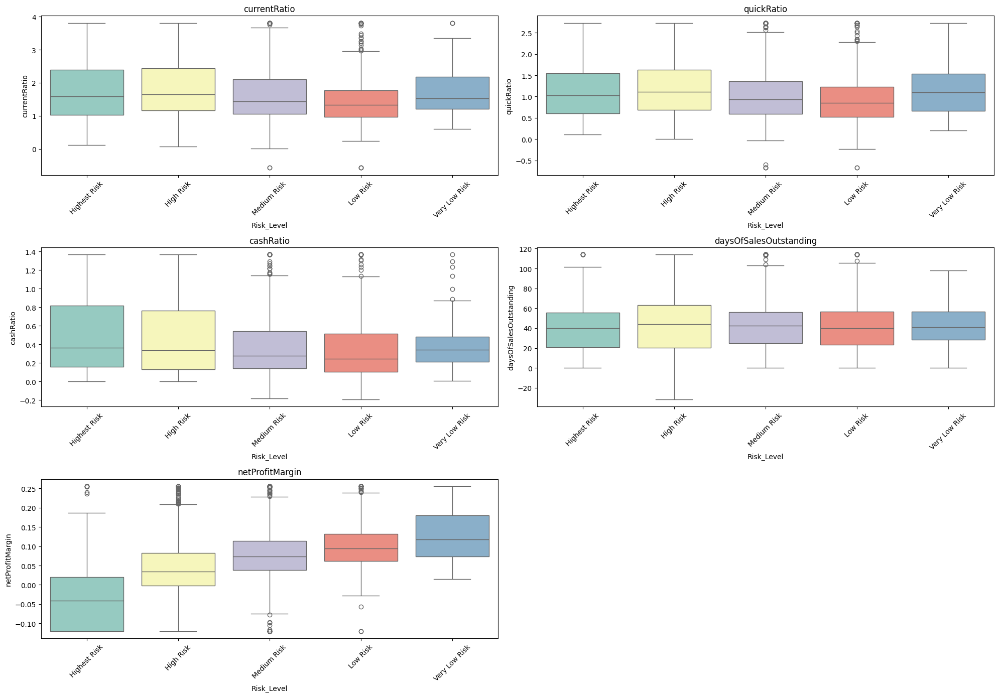

/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

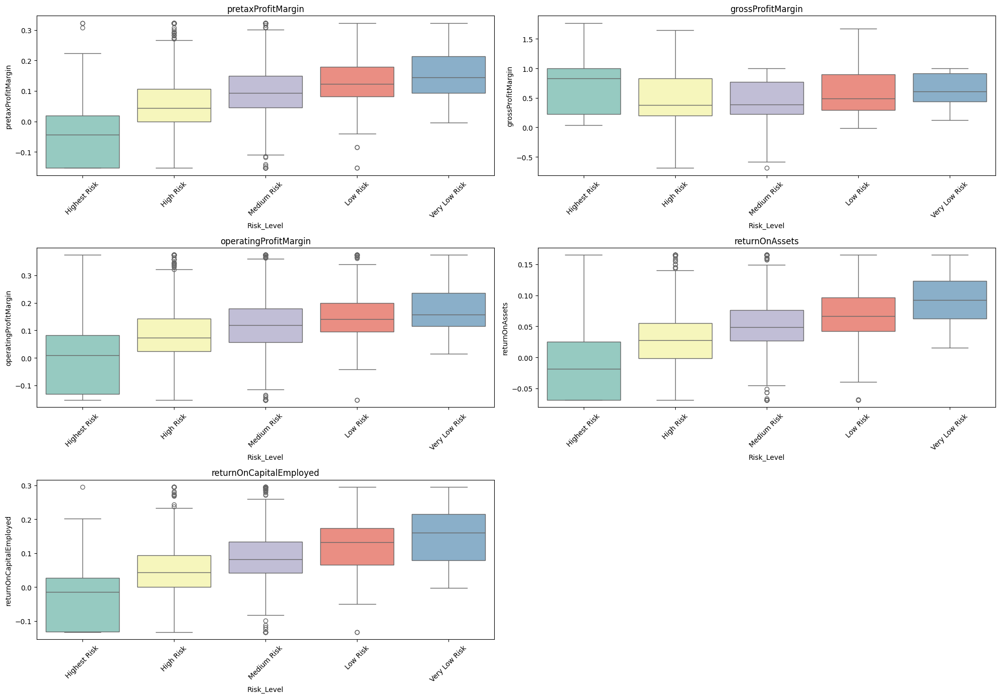

/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

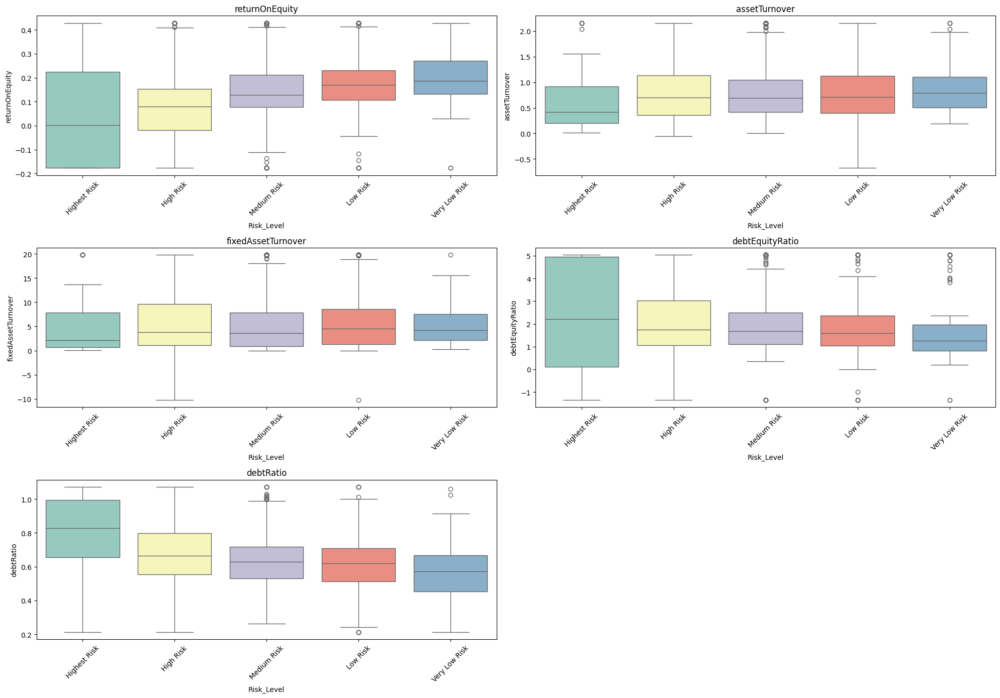

/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

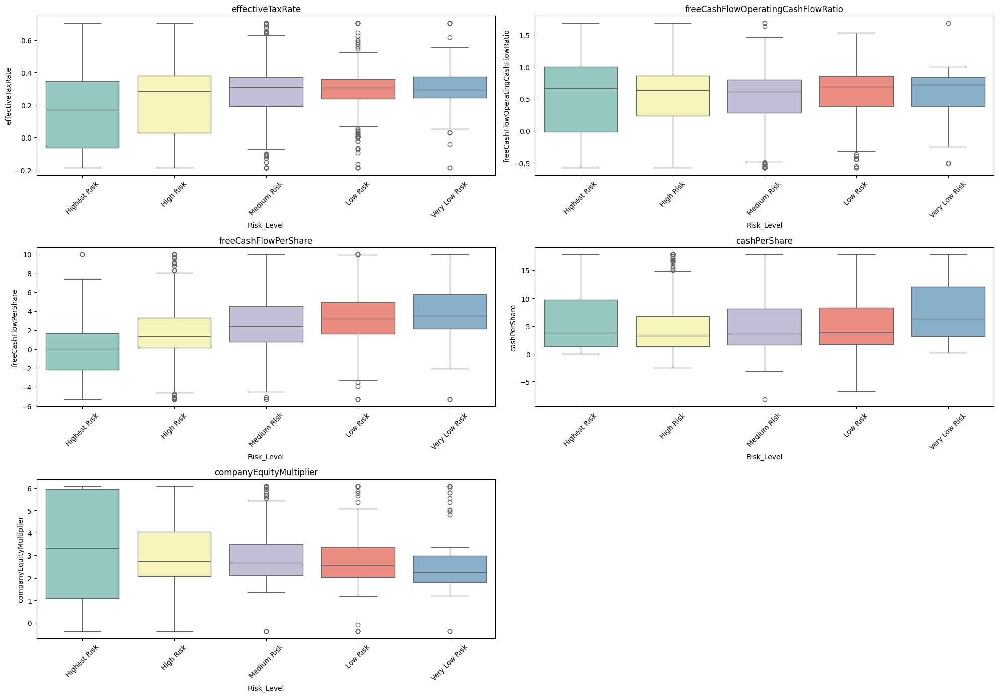

/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
/tmp/ipython-input-3519840038.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

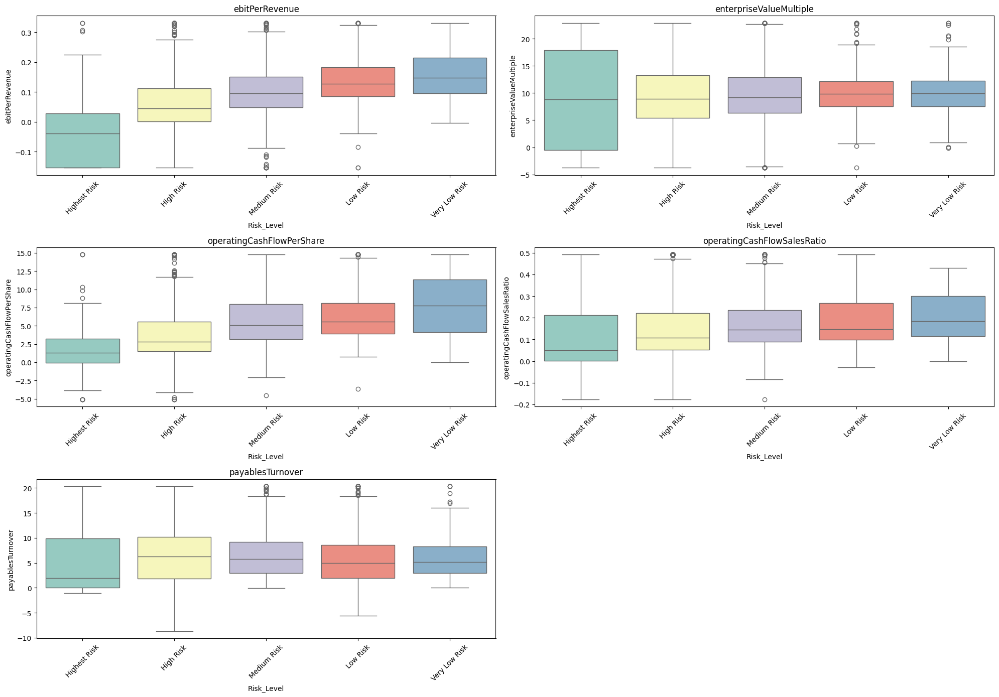

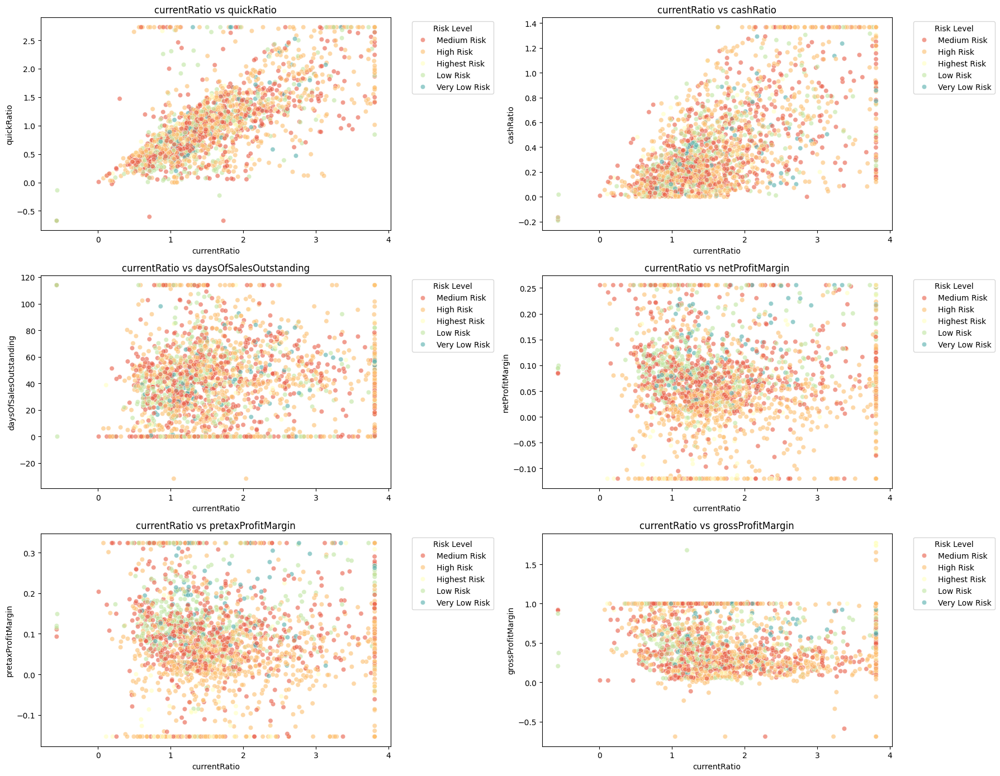

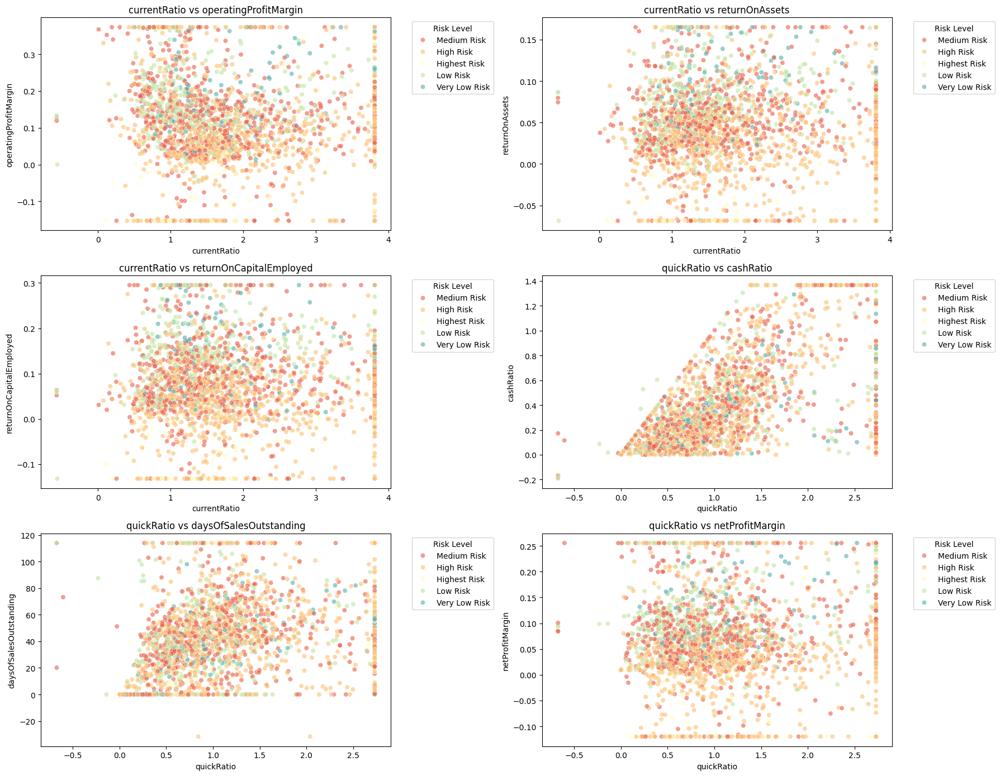

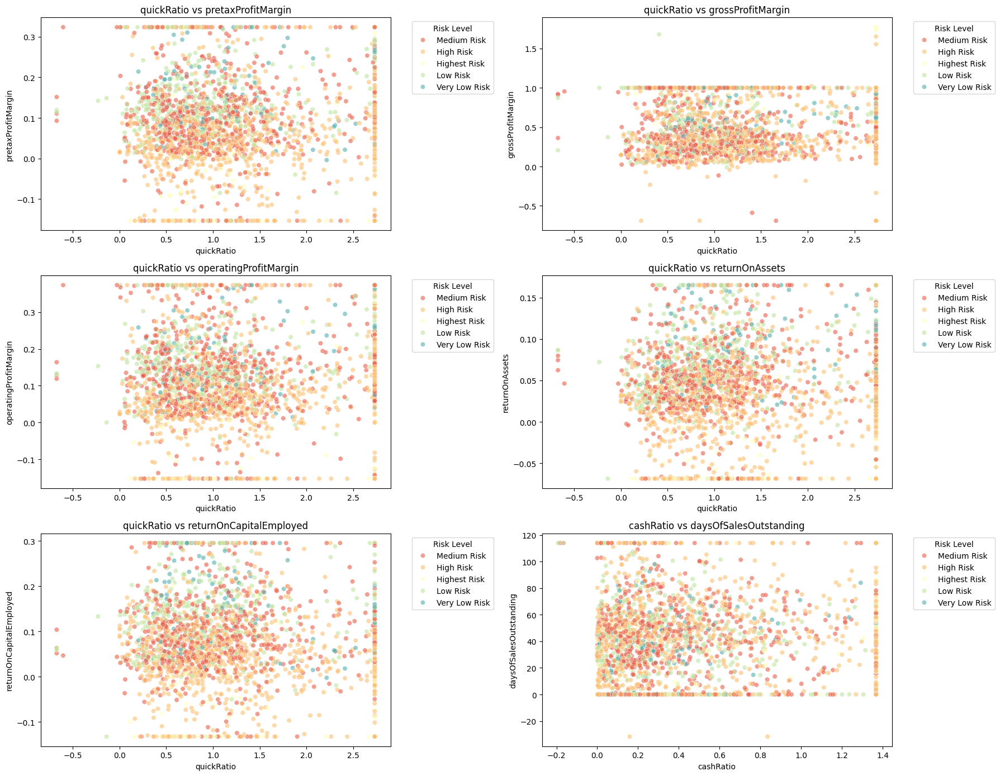

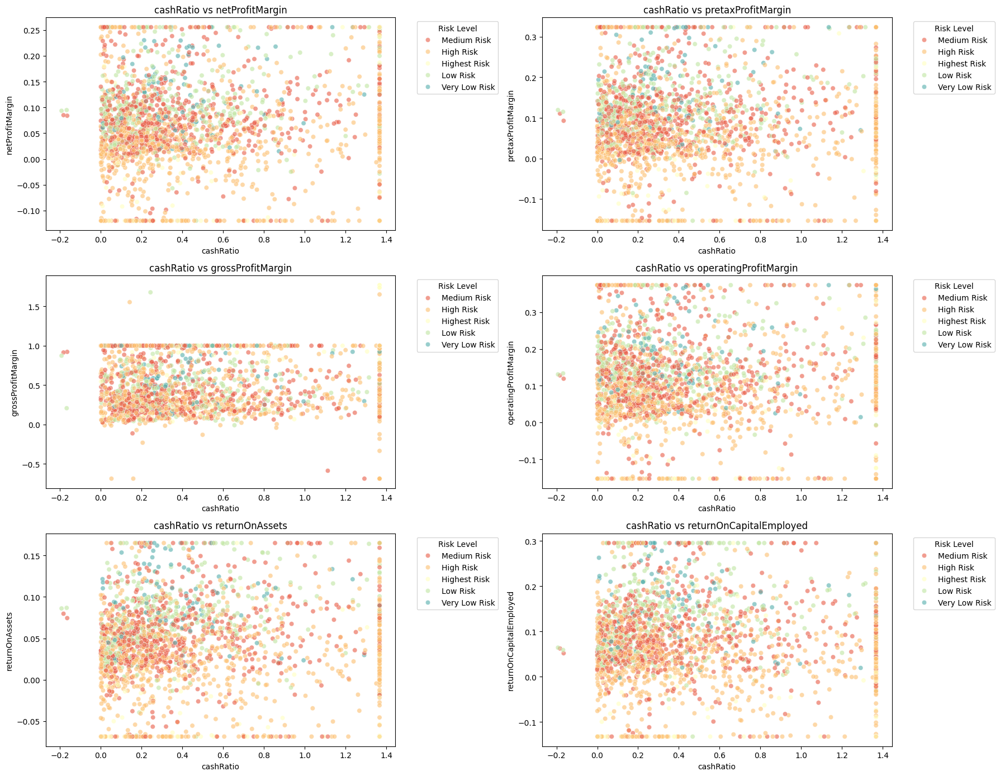

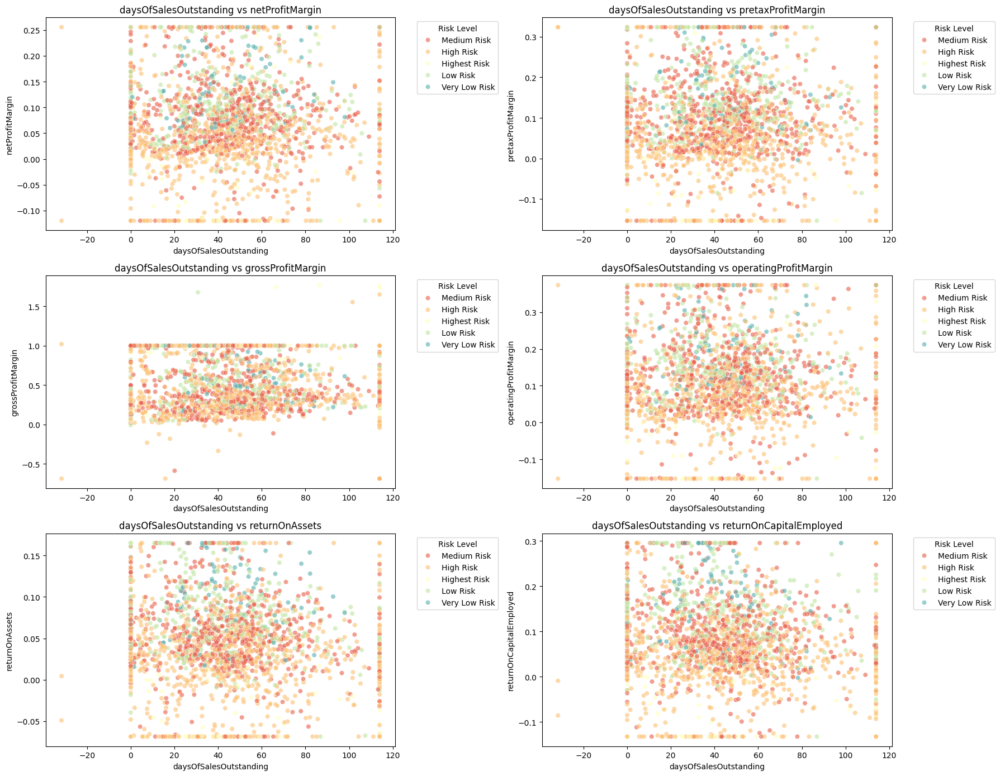

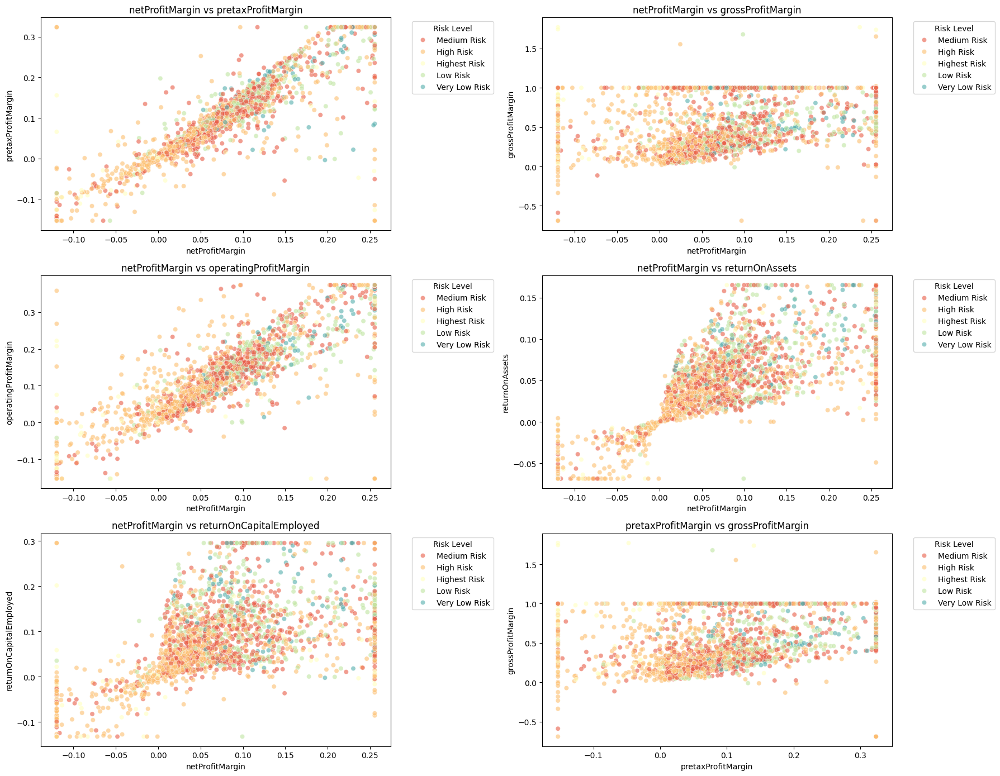

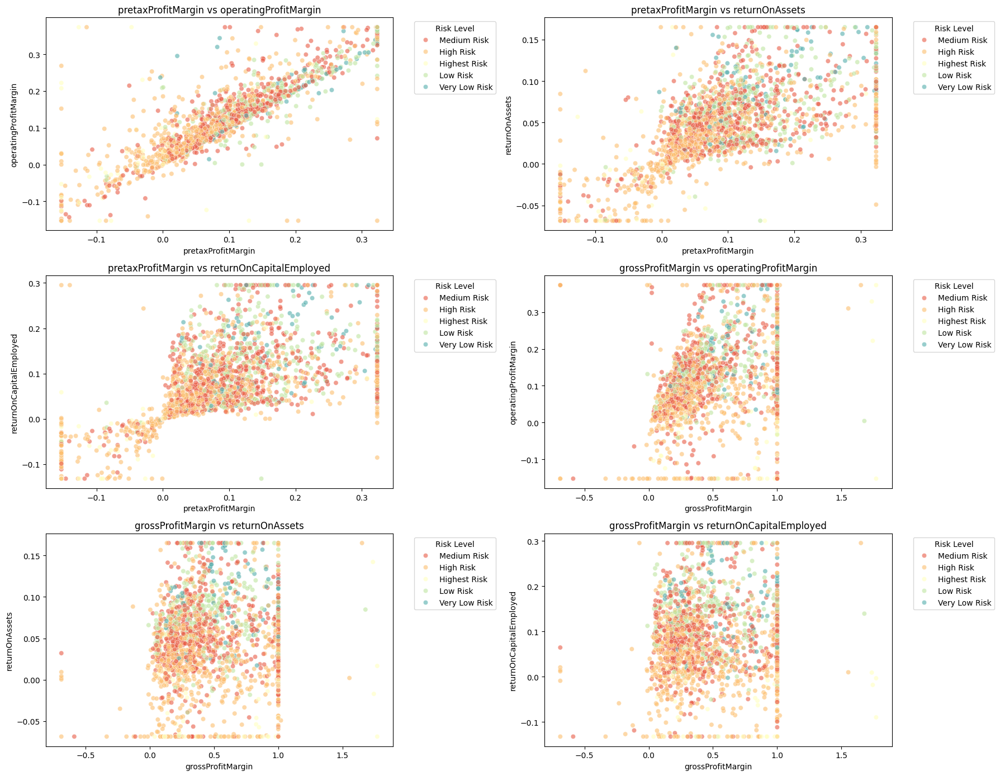

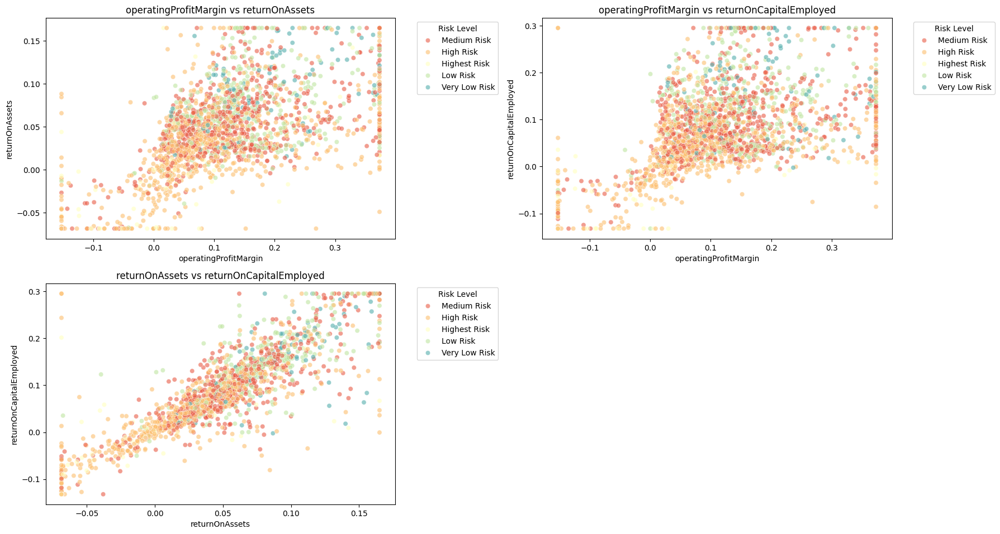

✅ Boxplots and scatter plots generated successfully.


In [ ]:
# ===============================================================
# 🧹 Replace Outliers with ±1.5×IQR Thresholds (Capped Values)
# ===============================================================
df_rating_no_out = df_risk.copy()

for col in num_cols:
    Q1 = df_risk[col].quantile(0.25)
    Q3 = df_risk[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Clip values to IQR thresholds
    df_rating_no_out[col] = df_risk[col].clip(lower, upper)

print("✅ Outliers replaced with ±1.5×IQR threshold limits.")
print(f"Updated numeric variables: {len(num_cols)} columns")

# ===============================================================
# 📊 1️⃣ Boxplots by Risk Level
# ===============================================================
plt.figure(figsize=(18, 14))
sns.boxplot(data=df_rating_no_out, x='Risk_Level', y='currentRatio', palette='coolwarm', order=['Highest Risk', 'High Risk', 'Medium Risk', 'Low Risk', 'Very Low Risk'])
plt.title("Boxplot of Current Ratio by Risk Level")
plt.show()

# For all numeric columns: group into large multi-plots for easier viewing
cols_per_plot = 5
num_plots = int(np.ceil(len(num_cols) / cols_per_plot))

for i in range(num_plots):
    plt.figure(figsize=(20, 14))
    subset = num_cols[i * cols_per_plot:(i + 1) * cols_per_plot]
    for j, col in enumerate(subset, 1):
        plt.subplot(3, 2, j)
        sns.boxplot(data=df_rating_no_out, x='Risk_Level', y=col, palette='Set3',
                    order=['Highest Risk', 'High Risk', 'Medium Risk', 'Low Risk', 'Very Low Risk'])
        plt.xticks(rotation=45)
        plt.title(col)
    plt.tight_layout()
    plt.show()

# ===============================================================
# 🔍 2️⃣ Scatter Plots for Relationship Visualization
# ===============================================================
# Pair numerical variables two-by-two to visualize clustering by Risk_Level
from itertools import combinations

pairs = list(combinations(num_cols[:10], 2))  # use top 10 numeric vars for visibility
plots_per_fig = 6
num_figs = int(np.ceil(len(pairs) / plots_per_fig))

for i in range(num_figs):
    plt.figure(figsize=(18, 14))
    subset_pairs = pairs[i * plots_per_fig:(i + 1) * plots_per_fig]
    for j, (xcol, ycol) in enumerate(subset_pairs, 1):
        plt.subplot(3, 2, j)
        sns.scatterplot(
            data=df_rating_no_out,
            x=xcol, y=ycol,
            hue='Risk_Level',
            palette='Spectral',
            alpha=0.6
        )
        plt.title(f"{xcol} vs {ycol}")
        plt.legend(title='Risk Level', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

print("✅ Boxplots and scatter plots generated successfully.")


## key findings from the plots (general implications)

| **Risk Level** | **Typical Financial Profile** |
|:---------------|:------------------------------|
| **Highest Risk** | Low profit, weak cash flow, high leverage, wide variability |
| **High Risk** | Slightly better margins, still high debt |
| **Medium Risk** | Moderate profitability, improving liquidity |
| **Low Risk** | Stable operations, good returns, controlled leverage |
| **Very Low Risk** | Strong profitability, steady cash flow, lowest leverage |


## numerical data reshaping

## Q3 3-1

In [ ]:
# ===============================================================
# 14️⃣ Data Reshaping — Normalize + Log10 + Correct Year Split
# ===============================================================
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Start from encoded dataset
df_model = df_encoded.copy()

# ---------------------------------------------------------------
# 1️⃣ Identify numerical columns to transform
# ---------------------------------------------------------------
num_cols = df_model.select_dtypes(include=['float64', 'int64']).columns
num_cols = [c for c in num_cols if c not in ['Year', 'Risk_Level_num']]

# ---------------------------------------------------------------
# 2️⃣ Normalize numerical variables between 0–1
# ---------------------------------------------------------------
scaler = MinMaxScaler()
df_model[num_cols] = scaler.fit_transform(df_model[num_cols])

# ---------------------------------------------------------------
# 3️⃣ Apply log10 transformation (add +1 to avoid log(0))
# ---------------------------------------------------------------
df_model[num_cols] = np.log10(df_model[num_cols] + 1)

# ---------------------------------------------------------------
# 4️⃣ Define target
# ---------------------------------------------------------------
y = df_model["Risk_Level_num"]

# ---------------------------------------------------------------
# 5️⃣ Keep ONLY numeric columns for modeling
# ---------------------------------------------------------------
X = df_model.select_dtypes(include=["float64", "int64", "bool"]).copy()

# Remove target from X
X = X.drop(columns=["Risk_Level_num"])

# ---------------------------------------------------------------
# 6️⃣ Time-based split
# Train: 2010–2014
# Test: 2015
# Validation: 2016
# ---------------------------------------------------------------
train_mask = (df_model["Year"] >= 2010) & (df_model["Year"] <= 2014)
test_mask  = (df_model["Year"] == 2015)
val_mask   = (df_model["Year"] == 2016)

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

X_val = X[val_mask]
y_val = y[val_mask]

# ---------------------------------------------------------------
# 7️⃣ Print split summary
# ---------------------------------------------------------------
print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)
print("Validation shape:", X_val.shape)
print("Unique labels:", sorted(y.unique()))

print("\nTrain class counts:\n", y_train.value_counts())
print("\nTest class counts:\n", y_test.value_counts())
print("\nValidation class counts:\n", y_val.value_counts())

# ---------------------------------------------------------------
# 8️⃣ Sanity check – confirm NO object columns remain
# ---------------------------------------------------------------
print("\nRemaining object columns in X:",
      X_train.dtypes[X_train.dtypes == "object"])


Train shape: (1119, 41)
Test shape: (480, 41)
Validation shape: (428, 41)
Unique labels: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]

Train class counts:
 Risk_Level_num
1    412
2    378
3    236
4     54
0     39
Name: count, dtype: int64

Test class counts:
 Risk_Level_num
1    175
2    145
3    123
4     31
0      6
Name: count, dtype: int64

Validation class counts:
 Risk_Level_num
1    204
2    148
3     39
0     27
4     10
Name: count, dtype: int64

Remaining object columns in X: Series([], dtype: object)


## Machine Learning model building

XGB Accuracy: 0.6229166666666667
GBT Accuracy: 0.59375
RF Accuracy: 0.6395833333333333
SVM Accuracy: 0.42083333333333334
MLP Accuracy: 0.3645833333333333
GNB Accuracy: 0.11875
LDA Accuracy: 0.45625
QDA Accuracy: 0.29791666666666666


/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 2 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 3 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/p

KNN Accuracy: 0.44583333333333336
LR Accuracy: 0.45


/tmp/ipython-input-3655583289.py:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Model', y='Accuracy', data=df_accuracy, palette='rocket')


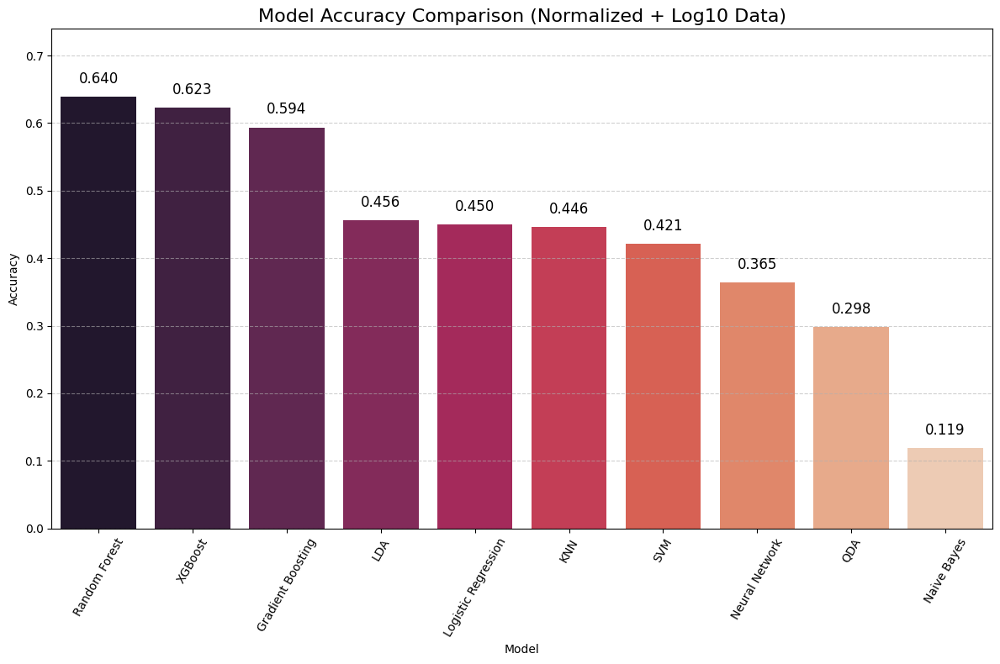

In [ ]:


# ===============================================================
# 16️⃣ Model Exploration
# ===============================================================
from sklearn import metrics, svm
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------------
# XGBoost
# ---------------------------------------------------------------
XGB_model = xgb.XGBClassifier(objective='multi:softmax', num_class=5, random_state=1234)
XGB_model.fit(X_train, y_train)
y_pred_XGB = XGB_model.predict(X_test)
Accuracy_XGB = metrics.accuracy_score(y_test, y_pred_XGB)
print("XGB Accuracy:", Accuracy_XGB)

# ---------------------------------------------------------------
# Gradient Boosting
# ---------------------------------------------------------------
GBT_model = GradientBoostingClassifier(random_state=123)
GBT_model.fit(X_train, y_train)
y_pred_GBT = GBT_model.predict(X_test)
Accuracy_GBT = metrics.accuracy_score(y_test, y_pred_GBT)
print("GBT Accuracy:", Accuracy_GBT)

# ---------------------------------------------------------------
# Random Forest
# ---------------------------------------------------------------
RF_model = RandomForestClassifier(random_state=1234)
RF_model.fit(X_train, y_train)
y_pred_RF = RF_model.predict(X_test)
Accuracy_RF = metrics.accuracy_score(y_test, y_pred_RF)
print("RF Accuracy:", Accuracy_RF)

# ---------------------------------------------------------------
# Support Vector Machine
# ---------------------------------------------------------------
SVC_model = svm.SVC(kernel='rbf', gamma=2, C=5, random_state=1234)
SVC_model.fit(X_train, y_train)
y_pred_SVM = SVC_model.predict(X_test)
Accuracy_SVM = metrics.accuracy_score(y_test, y_pred_SVM)
print("SVM Accuracy:", Accuracy_SVM)

# ---------------------------------------------------------------
# Neural Network
# ---------------------------------------------------------------
MLP_model = MLPClassifier(hidden_layer_sizes=(5,5,5), activation='logistic', solver='adam', max_iter=1500)
MLP_model.fit(X_train, y_train)
y_pred_MLP = MLP_model.predict(X_test)
Accuracy_MLP = metrics.accuracy_score(y_test, y_pred_MLP)
print("MLP Accuracy:", Accuracy_MLP)

# ---------------------------------------------------------------
# Naive Bayes
# ---------------------------------------------------------------
GNB_model = GaussianNB()
GNB_model.fit(X_train, y_train)
y_pred_GNB = GNB_model.predict(X_test)
Accuracy_GNB = metrics.accuracy_score(y_test, y_pred_GNB)
print("GNB Accuracy:", Accuracy_GNB)

# ---------------------------------------------------------------
# Linear & Quadratic Discriminant
# ---------------------------------------------------------------
LDA_model = LinearDiscriminantAnalysis()
LDA_model.fit(X_train, y_train)
y_pred_LDA = LDA_model.predict(X_test)
Accuracy_LDA = metrics.accuracy_score(y_test, y_pred_LDA)
print("LDA Accuracy:", Accuracy_LDA)

QDA_model = QuadraticDiscriminantAnalysis()
QDA_model.fit(X_train, y_train)
y_pred_QDA = QDA_model.predict(X_test)
Accuracy_QDA = metrics.accuracy_score(y_test, y_pred_QDA)
print("QDA Accuracy:", Accuracy_QDA)

# ---------------------------------------------------------------
# KNN
# ---------------------------------------------------------------
KNN_model = KNeighborsClassifier(n_neighbors=3)
KNN_model.fit(X_train, y_train)
y_pred_KNN = KNN_model.predict(X_test)
Accuracy_KNN = metrics.accuracy_score(y_test, y_pred_KNN)
print("KNN Accuracy:", Accuracy_KNN)

# ---------------------------------------------------------------
# Logistic Regression
# ---------------------------------------------------------------
LR_model = LogisticRegression(random_state=1234, multi_class='multinomial', solver='newton-cg')
LR_model.fit(X_train, y_train)
y_pred_LR = LR_model.predict(X_test)
Accuracy_LR = metrics.accuracy_score(y_test, y_pred_LR)
print("LR Accuracy:", Accuracy_LR)

# ===============================================================
# 17️⃣ Compare Results
# ===============================================================
accuracy_list = [
    Accuracy_XGB, Accuracy_GBT, Accuracy_RF, Accuracy_SVM, Accuracy_MLP,
    Accuracy_GNB, Accuracy_LDA, Accuracy_QDA, Accuracy_KNN, Accuracy_LR
]
model_list = [
    'XGBoost', 'Gradient Boosting', 'Random Forest', 'SVM',
    'Neural Network', 'Naive Bayes', 'LDA', 'QDA', 'KNN', 'Logistic Regression'
]

df_accuracy = pd.DataFrame({'Model': model_list, 'Accuracy': accuracy_list})
df_accuracy = df_accuracy.sort_values(by='Accuracy', ascending=False).reset_index(drop=True)

plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Model', y='Accuracy', data=df_accuracy, palette='rocket')

plt.title('Model Accuracy Comparison (Normalized + Log10 Data)', fontsize=16)
plt.xticks(rotation=60)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Add numbers on bars
for i, v in enumerate(df_accuracy["Accuracy"]):
    ax.text(i, v + 0.02, f"{v:.3f}", ha='center', fontsize=12, color='black')

plt.ylim(0, max(df_accuracy["Accuracy"]) + 0.1)
plt.tight_layout()
plt.show()


## Choose XGBoost model and  Random forest model
## For XGBoost model:
1. **RF currently has a small accuracy edge before tuning**, but **XGBoost has a much larger tuning potential** because its performance is highly sensitive to parameters like learning rate, tree depth, regularization terms, and sampling rates. In contrast, RF’s default settings are already close to optimal, so additional tuning usually brings smaller gains.
2. **XGBoost is a boosting model**, meaning it learns sequentially and **corrects mistakes at each iteration**, while Random Forest relies on a simple **majority vote across independent trees**. Boosting generally captures complex nonlinear patterns better and offers stronger predictive power after tuning.
## For random forest model:
1. **RF performs very well even before tuning**, showing strong baseline stability.Also, random Forests are less sensitive to hyperparameters.
2. **RF reduces overfitting naturally through bootstrapping and feature randomness**, RF works better on small scale datasets, helps the model stay robust on noisy financial ratios by averaging many decorrelated trees.



## Tuning XGBoost model

Train shape: (1119, 41)
Test shape: (480, 41)
Validation shape: (428, 41)
Unique labels: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]
Total combinations: 256

✅ Best validation accuracy: 0.6191588785046729
✅ Best parameters:
   learning_rate = 0.1
   max_depth = 5
   min_child_weight = 5
   subsample = 0.8
   colsample_bytree = 1.0
   gamma = 0.5
   reg_lambda = 1.0
   reg_alpha = 0.0

=== 📊 Final Test Performance (2015) ===
Accuracy: 0.63125
              precision    recall  f1-score   support

           0      0.000     0.000     0.000         6
           1      0.689     0.771     0.728       175
           2      0.591     0.538     0.563       145
           3      0.642     0.626     0.634       123
           4      0.464     0.419     0.441        31

    accuracy                          0.631       480
   macro avg      0.477     0.471     0.473       480
weighted avg      0.624     0.631     0.626       480



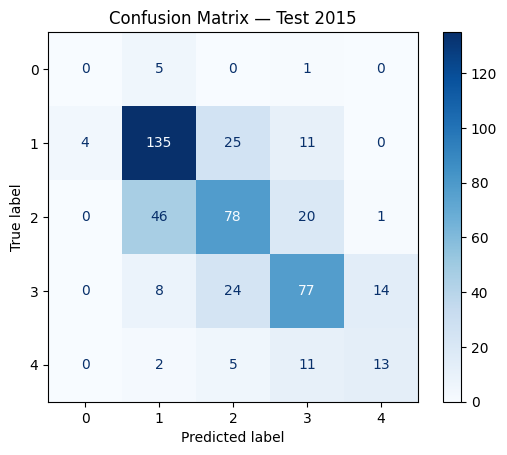


=== 📊 Validation Performance (2016) ===
Accuracy: 0.6191588785046729
              precision    recall  f1-score   support

           0      0.400     0.074     0.125        27
           1      0.695     0.814     0.749       204
           2      0.600     0.547     0.572       148
           3      0.327     0.410     0.364        39
           4      0.000     0.000     0.000        10

    accuracy                          0.619       428
   macro avg      0.404     0.369     0.362       428
weighted avg      0.594     0.619     0.596       428



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


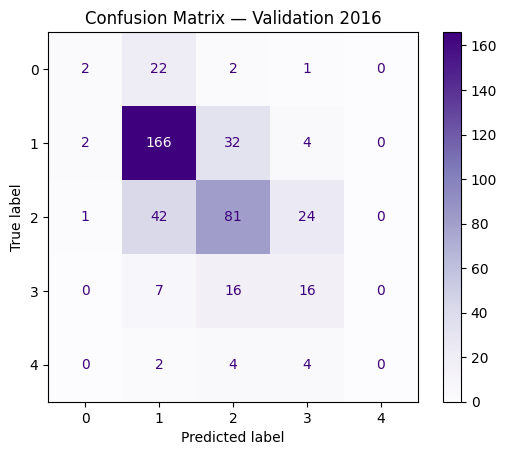

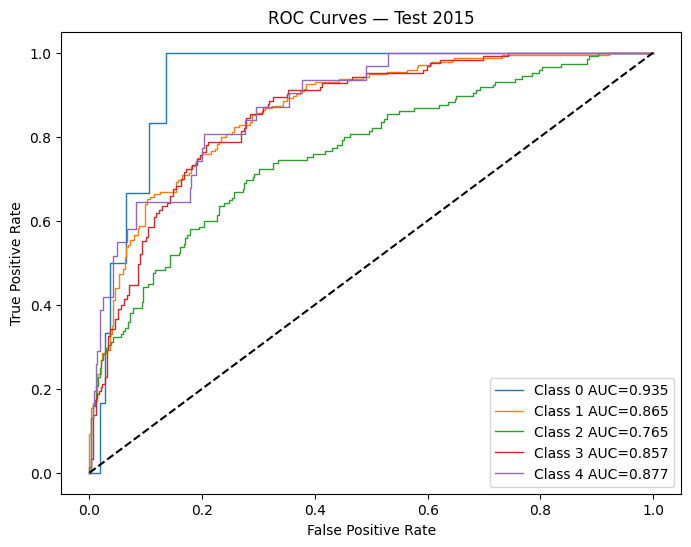

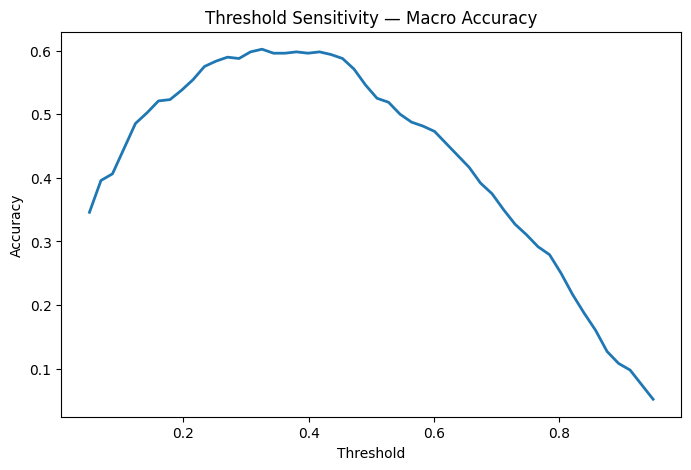


Best threshold = 0.3255102040816326


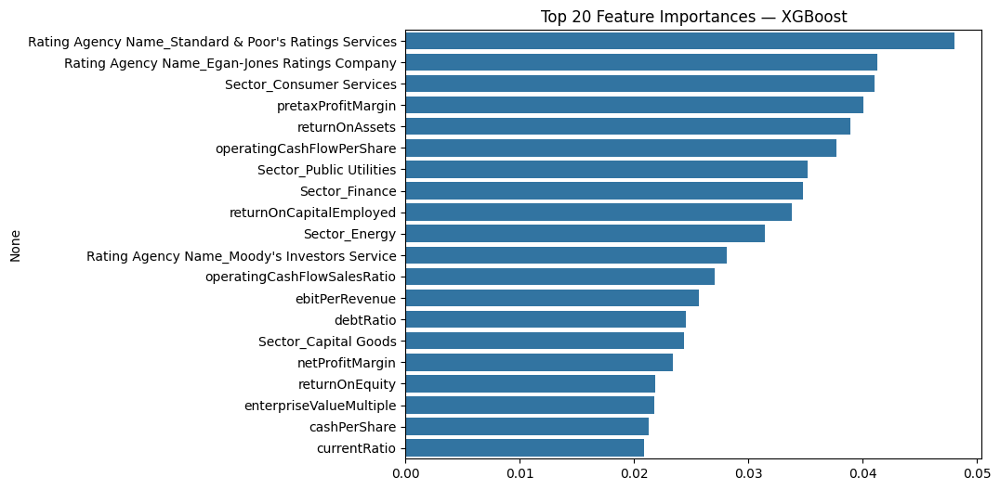

In [ ]:
# ===============================================================
# 🔧 XGBoost Hyperparameter Tuning — Full Report Version
# ===============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc,
    precision_recall_curve
)
from sklearn.preprocessing import label_binarize

# ---------------------------------------------------------------
# Check splits
# ---------------------------------------------------------------
print("Train shape:", X_train.shape)
print("Test shape:",  X_test.shape)
print("Validation shape:", X_val.shape)
print("Unique labels:", sorted(y_train.unique()))

# ===============================================================
# 1️⃣ Hyperparameter Grid
# ===============================================================
from itertools import product

param_grid = {
    "learning_rate":   [0.03, 0.1],
    "max_depth":       [3, 5],
    "min_child_weight":[1, 5],
    "subsample":       [0.8, 1.0],
    "colsample_bytree":[0.8, 1.0],
    "gamma":           [0.0, 0.5],
    "reg_lambda":      [1.0, 5.0],
    "reg_alpha":       [0.0, 0.5]
}

keys = list(param_grid.keys())
grid_combos = list(product(*[param_grid[k] for k in keys]))

print("Total combinations:", len(grid_combos))

# ===============================================================
# 2️⃣ Manual Validation Tuning (no early stopping)
# ===============================================================
best_params = None
best_val_acc = -np.inf
best_model = None

for combo in grid_combos:

    params = dict(zip(keys, combo))

    model = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=5,
        random_state=1234,
        n_estimators=350,     # safe fixed count
        eval_metric="mlogloss",
        **params
    )

    model.fit(X_train, y_train)

    y_val_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_val_pred)

    if acc > best_val_acc:
        best_val_acc = acc
        best_params = params
        best_model = model

print("\n✅ Best validation accuracy:", best_val_acc)
print("✅ Best parameters:")
for k, v in best_params.items():
    print("  ", k, "=", v)

# ===============================================================
# 3️⃣ Test Set Performance (Year 2015)
# ===============================================================
y_test_pred = best_model.predict(X_test)
y_test_prob = best_model.predict_proba(X_test)

print("\n=== 📊 Final Test Performance (2015) ===")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred, digits=3))

cm = confusion_matrix(y_test, y_test_pred)
ConfusionMatrixDisplay(cm).plot(cmap="Blues")
plt.title("Confusion Matrix — Test 2015")
plt.show()

# ===============================================================
# 4️⃣ Validation Performance (2016)
# ===============================================================
y_val_pred2 = best_model.predict(X_val)

print("\n=== 📊 Validation Performance (2016) ===")
print("Accuracy:", accuracy_score(y_val, y_val_pred2))
print(classification_report(y_val, y_val_pred2, digits=3))

cmv = confusion_matrix(y_val, y_val_pred2)
ConfusionMatrixDisplay(cmv).plot(cmap="Purples")
plt.title("Confusion Matrix — Validation 2016")
plt.show()

# ===============================================================
# 5️⃣ ROC–AUC (One-vs-Rest)
# ===============================================================
classes = np.sort(y_train.unique())
y_test_bin = label_binarize(y_test, classes=classes)

fpr, tpr, roc_auc = {}, {}, {}

for i, c in enumerate(classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8,6))
for i, c in enumerate(classes):
    plt.plot(fpr[i], tpr[i], lw=1, label=f"Class {c} AUC={roc_auc[i]:.3f}")

plt.plot([0,1],[0,1],'k--')
plt.title("ROC Curves — Test 2015")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

# ===============================================================
# 6️⃣ Threshold Analysis (macro-averaged)
# ===============================================================
thresholds = np.linspace(0.05, 0.95, 50)
macro_scores = []

for t in thresholds:
    pred_adj = np.argmax((y_test_prob >= t).astype(int), axis=1)
    macro_scores.append(accuracy_score(y_test, pred_adj))

plt.figure(figsize=(8,5))
plt.plot(thresholds, macro_scores, lw=2)
plt.title("Threshold Sensitivity — Macro Accuracy")
plt.xlabel("Threshold")
plt.ylabel("Accuracy")
plt.show()

best_t = thresholds[np.argmax(macro_scores)]
print("\nBest threshold =", best_t)

# ===============================================================
# 7️⃣ Feature Importance
# ===============================================================
fi = pd.Series(best_model.feature_importances_, index=X_train.columns)
fi = fi.sort_values(ascending=False).head(20)

plt.figure(figsize=(8,6))
sns.barplot(x=fi.values, y=fi.index)
plt.title("Top 20 Feature Importances — XGBoost")
plt.show()


In [ ]:
# ===============================================================
# 2. Class Weights
# ===============================================================
class_counts = y_train.value_counts().sort_index()
total = len(y_train)
class_weights = {cls: total / (len(class_counts) * cnt) for cls, cnt in class_counts.items()}
print("Class weights:", class_weights)

# ===============================================================
# 3. RF Hyperparameter Tuning (Traditional Manual Grid)
# ===============================================================
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from itertools import product

# 🔧 GRID — safe but expanded (not too slow)
param_grid = {
    "n_estimators":      [150, 300, 500],
    "max_depth":         [5, 10, 15],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf":  [1, 2, 4],
    "max_features":      ["sqrt", "log2"],
    "bootstrap":         [True]
}

keys = list(param_grid.keys())
grid_combos = list(product(*[param_grid[k] for k in keys]))
print("Total combos:", len(grid_combos))

best_params = None
best_val_acc = -1

for combo in grid_combos:
    params = dict(zip(keys, combo))

    model = RandomForestClassifier(
        **params,
        class_weight=class_weights,
        random_state=1234,
        n_jobs=-1
    )

    model.fit(X_train, y_train)
    y_val_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_val_pred)

    if acc > best_val_acc:
        best_val_acc = acc
        best_params = params

print("\nBest Validation Accuracy:", best_val_acc)
print("Best Parameters:", best_params)

# ===============================================================
# 4. Fit Final Model on Train + Validation
# ===============================================================

rf_final = RandomForestClassifier(
    **best_params,
    class_weight=class_weights,
    random_state=1234,
    n_jobs=-1
)

X_train_full = pd.concat([X_train, X_val], axis=0)
y_train_full = pd.concat([y_train, y_val], axis=0)

rf_final.fit(X_train_full, y_train_full)

# ===============================================================
# 5. Evaluation Function
# ===============================================================
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate(split_name, Xs, ys):
    y_pred = rf_final.predict(Xs)
    acc = accuracy_score(ys, y_pred)

    print(f"\n=== 📊 {split_name} Accuracy: {acc:.4f} ===")
    print(classification_report(ys, y_pred, digits=3))

    cm = confusion_matrix(ys, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix — {split_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    return acc

train_acc = evaluate("Train (2011–2013 + 2015)", X_train_full, y_train_full)
test_acc  = evaluate("Test (2014)", X_test, y_test)
val_acc   = evaluate("Validation (2015)", X_val, y_val)

# ===============================================================
# 6. ROC Curves
# ===============================================================
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

classes = sorted(y_train_full.unique())
y_test_bin = label_binarize(y_test, classes=classes)
y_test_prob = rf_final.predict_proba(X_test)

plt.figure(figsize=(7,5))
for i, cls in enumerate(classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"Class {cls} (AUC={auc_score:.2f})")

plt.plot([0,1],[0,1],"k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves — Random Forest")
plt.legend()
plt.show()

# ===============================================================
# 7. PR Curve for Highest Risk (0)
# ===============================================================
from sklearn.metrics import precision_recall_curve

high_risk = 0
precision, recall, _ = precision_recall_curve(
    y_test_bin[:, classes.index(high_risk)],
    y_test_prob[:, classes.index(high_risk)]
)

plt.figure(figsize=(7,5))
plt.plot(recall, precision, color="darkorange")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("PR Curve — High Risk Class (0)")
plt.show()

# ===============================================================
# 8. Threshold analysis
# ===============================================================
high_risk_set = {0,1}
y_test_binary = y_test.isin(high_risk_set).astype(int)
p_high_risk = y_test_prob[:, 0] + y_test_prob[:, 1]

thresholds = np.linspace(0.1, 0.9, 81)
tpr_list = []
fpr_list = []

for t in thresholds:
    pred = (p_high_risk >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test_binary, pred).ravel()
    tpr = tp/(tp+fn) if (tp+fn) else 0
    fpr = fp/(fp+tn) if (fp+tn) else 0
    tpr_list.append(tpr)
    fpr_list.append(fpr)

plt.figure(figsize=(7,5))
plt.plot(thresholds, tpr_list, label="TPR")
plt.plot(thresholds, fpr_list, label="FPR")
plt.xlabel("Threshold")
plt.ylabel("Rate")
plt.title("Threshold Trade-Off — High Risk vs Safe")
plt.legend()
plt.grid(True)
plt.show()

# ===============================================================
# 9. Feature Importances
# ===============================================================
importances = pd.Series(rf_final.feature_importances_, index=X_train.columns)
top20 = importances.sort_values(ascending=False).head(20)

plt.figure(figsize=(8,10))
sns.barplot(x=top20.values, y=top20.index)
plt.title("Top 20 Feature Importances — Random Forest")
plt.show()


# Hyperparameters -used

| **Hyperparameter** | **Meaning (Simple English)** | **Why It Matters** |
|--------------------|------------------------------|---------------------|
| **learning_rate** | Controls how fast the model learns. Small values = slower but safer learning. | Helps prevent overfitting and improves stability. |
| **max_depth** | Maximum depth of each tree. | Deep trees capture complex patterns but may overfit. |
| **min_child_weight** | Minimum data needed in a leaf before splitting. | Prevents creating leaves based on noise. |
| **subsample** | Fraction of training rows used to grow each tree. | Adds randomness and reduces overfitting. |
| **colsample_bytree** | Fraction of features used per tree. | Prevents the model from depending on only a few variables. |
| **gamma** | Minimum loss reduction required to make a split. | Higher gamma → more conservative splits, reduces overfitting. |
| **reg_lambda** (L2) | Penalizes large weights (Ridge). | Improves generalization and reduces variance. |
| **reg_alpha** (L1) | Penalizes unnecessary features (Lasso). | Helps with feature selection by forcing small weights to zero. |
| **n_estimators** | Number of boosted trees. | More trees improve accuracy but take longer and may overfit. |
| **objective = 'multi:softprob'** | Predicts probability for each class. | Required for multi-class (5-level risk) classification. |
| **num_class = 5** | Number of target classes. | Matches your encoded risk groups: 0–4. |
| **eval_metric = 'mlogloss'** | Evaluation metric for validation. | More reliable than accuracy when tuning hyperparameters. |
| **random_state** | Sets the seed for repeatable results. | Ensures your experiments are reproducible. |



## Output analysis
## The performance of the XGBoost model has very limited performance improvements after tuning,(even use optuna: Optuna is an automated hyperparameter optimization framework that uses intelligent search algorithms to efficiently find the best model settings without manual trial-and-error, the test accuracy only can be increased to around 0.64), Part of the reason is the small dataset (using my own grouping of credit grades, after spliting, the groups are extremely imbalanced and with very small samples for some grade in the training data, the other reason is the limited records of data, makes XGBoost not very suitable for this problem.

In [ ]:
! pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 10.6 MB/s eta 0:00:00


## Random forest model

[I 2025-11-13 04:38:44,627] A new study created in memory with name: no-name-7f2032f4-942d-4e8f-9f66-e5637bdb9c01


  0%|          | 0/60 [00:00<?, ?it/s]

[I 2025-11-13 04:38:46,113] Trial 0 finished with value: 0.3411214953271028 and parameters: {'n_estimators': 308, 'max_depth': 3, 'min_samples_split': 11, 'min_samples_leaf': 11, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.3411214953271028.
[I 2025-11-13 04:38:48,653] Trial 1 finished with value: 0.5233644859813084 and parameters: {'n_estimators': 478, 'max_depth': 20, 'min_samples_split': 13, 'min_samples_leaf': 11, 'max_features': 'log2', 'bootstrap': True}. Best is trial 1 with value: 0.5233644859813084.
[I 2025-11-13 04:38:50,496] Trial 2 finished with value: 0.602803738317757 and parameters: {'n_estimators': 334, 'max_depth': 12, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 2 with value: 0.602803738317757.
[I 2025-11-13 04:38:52,430] Trial 3 finished with value: 0.5397196261682243 and parameters: {'n_estimators': 420, 'max_depth': 7, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_featur

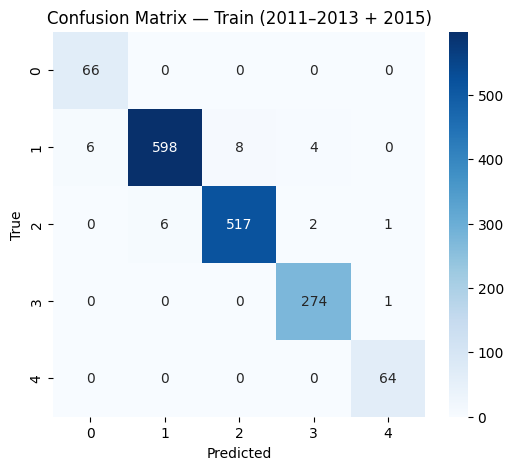


=== 📊 Test (2014) Accuracy: 0.6500 ===
              precision    recall  f1-score   support

           0      0.000     0.000     0.000         6
           1      0.719     0.703     0.711       175
           2      0.618     0.559     0.587       145
           3      0.645     0.740     0.689       123
           4      0.630     0.548     0.586        31

    accuracy                          0.650       480
   macro avg      0.523     0.510     0.515       480
weighted avg      0.655     0.650     0.651       480



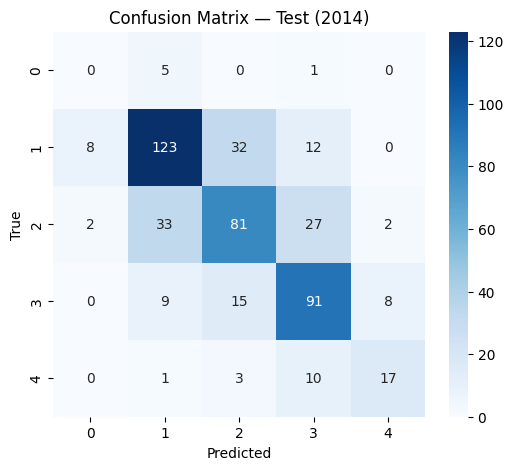


=== 📊 Validation (2015) Accuracy: 0.9813 ===
              precision    recall  f1-score   support

           0      0.900     1.000     0.947        27
           1      0.985     0.975     0.980       204
           2      0.986     0.980     0.983       148
           3      1.000     1.000     1.000        39
           4      1.000     1.000     1.000        10

    accuracy                          0.981       428
   macro avg      0.974     0.991     0.982       428
weighted avg      0.982     0.981     0.981       428



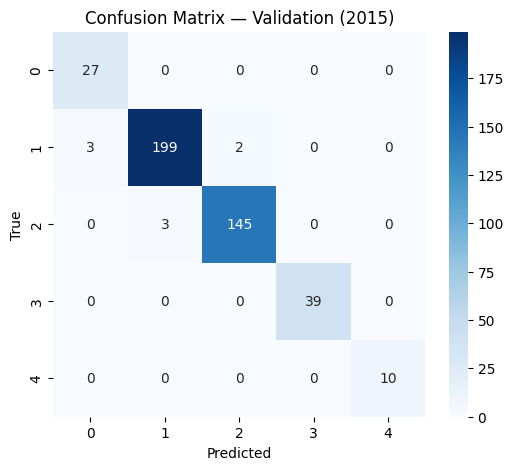

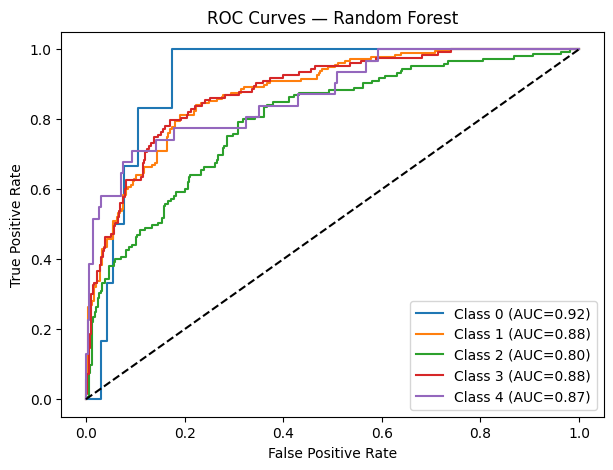

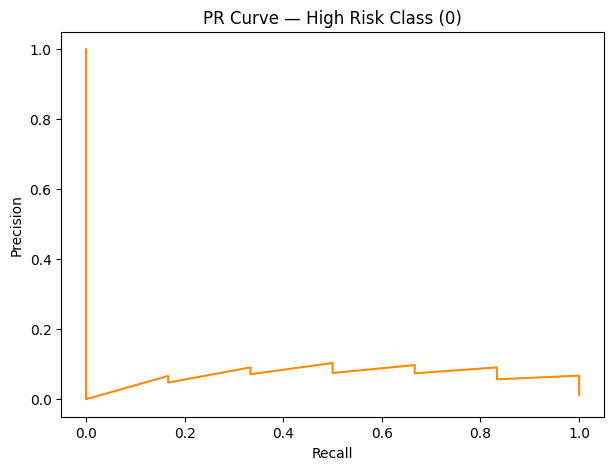

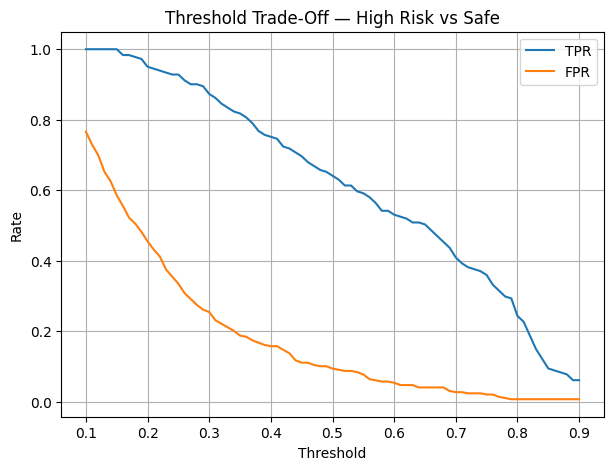

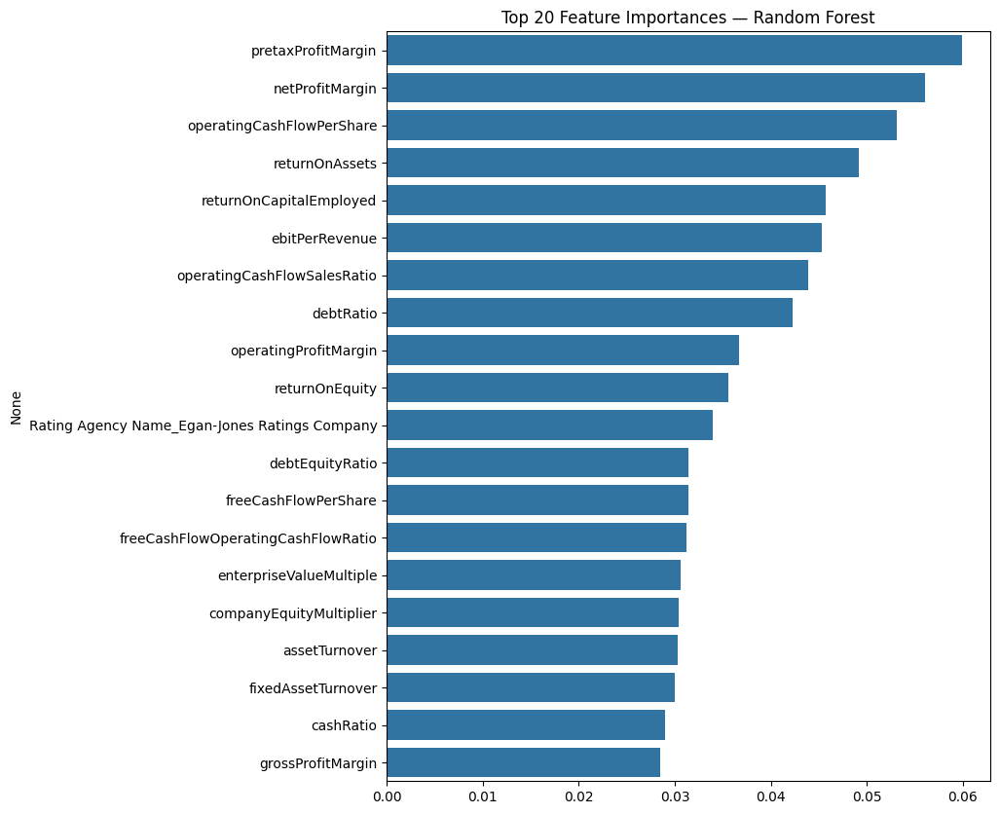

In [ ]:
# ===============================================================
# 2. Class Weights
# ===============================================================
class_counts = y_train.value_counts().sort_index()
total = len(y_train)
class_weights = {cls: total / (len(class_counts) * cnt) for cls, cnt in class_counts.items()}
class_weights
# ===============================================================
# 3. RF Hyperparameter Optimization (Optuna)
# ===============================================================
!pip install optuna --quiet

import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def rf_objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 150, 800),
        "max_depth": trial.suggest_int("max_depth", 3, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 15),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
        "class_weight": class_weights,
        "random_state": 1234,
        "n_jobs": -1
    }

    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)

    y_val_pred = model.predict(X_val)
    return accuracy_score(y_val, y_val_pred)


study = optuna.create_study(direction="maximize")
study.optimize(rf_objective, n_trials=60, show_progress_bar=True)

print("\nBest Validation Accuracy:", study.best_value)
print("Best Parameters:", study.best_params)
best_params = study.best_params
# ===============================================================
# 4. Fit Final Model
# ===============================================================
from sklearn.ensemble import RandomForestClassifier

rf_final = RandomForestClassifier(
    **best_params,
    class_weight=class_weights,
    random_state=1234,
    n_jobs=-1
)

X_train_full = pd.concat([X_train, X_val], axis=0)
y_train_full = pd.concat([y_train, y_val], axis=0)

rf_final.fit(X_train_full, y_train_full)
# ===============================================================
# 5. Evaluation Function
# ===============================================================
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate(split_name, Xs, ys):
    y_pred = rf_final.predict(Xs)
    acc = accuracy_score(ys, y_pred)

    print(f"\n=== 📊 {split_name} Accuracy: {acc:.4f} ===")
    print(classification_report(ys, y_pred, digits=3))

    cm = confusion_matrix(ys, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix — {split_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    return acc

train_acc = evaluate("Train (2011–2013 + 2015)", X_train_full, y_train_full)
test_acc  = evaluate("Test (2014)", X_test, y_test)
val_acc   = evaluate("Validation (2015)", X_val, y_val)
# ===============================================================
# 6. ROC Curves
# ===============================================================
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

classes = sorted(y_train_full.unique())
y_test_bin = label_binarize(y_test, classes=classes)
y_test_prob = rf_final.predict_proba(X_test)

plt.figure(figsize=(7,5))
for i, cls in enumerate(classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"Class {cls} (AUC={auc_score:.2f})")

plt.plot([0,1],[0,1],"k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves — Random Forest")
plt.legend()
plt.show()
from sklearn.metrics import precision_recall_curve

high_risk = 0
precision, recall, _ = precision_recall_curve(
    y_test_bin[:, classes.index(high_risk)],
    y_test_prob[:, classes.index(high_risk)]
)

plt.figure(figsize=(7,5))
plt.plot(recall, precision, color="darkorange")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("PR Curve — High Risk Class (0)")
plt.show()
# ===============================================================
# 8. Threshold analysis
# ===============================================================
high_risk_set = {0,1}
y_test_binary = y_test.isin(high_risk_set).astype(int)
p_high_risk = y_test_prob[:, 0] + y_test_prob[:, 1]

thresholds = np.linspace(0.1, 0.9, 81)
tpr_list = []
fpr_list = []

for t in thresholds:
    pred = (p_high_risk >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test_binary, pred).ravel()
    tpr = tp/(tp+fn) if (tp+fn) else 0
    fpr = fp/(fp+tn) if (fp+tn) else 0
    tpr_list.append(tpr)
    fpr_list.append(fpr)

plt.figure(figsize=(7,5))
plt.plot(thresholds, tpr_list, label="TPR")
plt.plot(thresholds, fpr_list, label="FPR")
plt.xlabel("Threshold")
plt.ylabel("Rate")
plt.title("Threshold Trade-Off — High Risk vs Safe")
plt.legend()
plt.grid(True)
plt.show()
# ===============================================================
# 9. Feature Importances
# ===============================================================
importances = pd.Series(rf_final.feature_importances_, index=X_train.columns)
top20 = importances.sort_values(ascending=False).head(20)

plt.figure(figsize=(8,10))
sns.barplot(x=top20.values, y=top20.index)
plt.title("Top 20 Feature Importances — Random Forest")
plt.show()


# Random Forest

| Hyperparameter | What It Controls |
|----------------|-----------------------------------|
| **n_estimators** | Number of trees in the forest. More trees → more stable predictions but slower. |
| **max_depth** | How deep each tree is allowed to grow. Large depth → more learning but higher overfitting risk. |
| **min_samples_split** | Minimum number of samples needed to split a node. Higher values → less overfitting, more generalization. |
| **min_samples_leaf** | Minimum samples allowed in a leaf node. Prevents tiny leaves that memorize noise. |
| **max_features** | How many features each tree can see. <br>• `"sqrt"` (default) → most common for classification <br>• `"log2"` → more randomness <br>• `None` → use *all* features. |
| **bootstrap** | Whether each tree trains on a random sample (bagging). <br>• `True` = classic Random Forest <br>• `False` = slightly lower variance but higher correlation between trees. |
| **class_weight** | Penalizes mistakes for rare classes by giving them higher weight. Helps fix imbalance. |
| **random_state** | Makes results reproducible. |
| **n_jobs** | Controls CPU usage. `-1` = use all CPU cores. |


## Final selection: Random Forest
After hyperparameter tuning with Optuna, **Random Forest achieved a higher test accuracy (0.650)** compared with **XGBoost (0.631)** and delivered **stronger macro and weighted F1 scores**. This indicates that Random Forest provides **more balanced performance across the five rating classes**, particularly for the **safer borrowers (class 4)** and the **middle-risk categories (classes 2 and 3)**.  

Both models struggle with the **rarest highest-risk class (class 0)**, which contains very few observations in the test set. As a result, the evaluation metrics for this class are unstable and close to zero. In practice, **additional data or a dedicated rare-event classification strategy** would be required to improve detection of this extreme-risk group.

NOTE:HERE THE SITUATION ONLY HAPPENS BECAUSE THE MERGER OF CLASSIFICATION OF CREDIT GRADES ARE NOT APPROPRIATE, IF CLASSIFY AS THE EXAMPLE OFFERED, WE MAY HAVE DIFFERENT MODEL CHOICE.(MOST LIKELY THE XGBOOST MODEL)

## Q3 3-2

In [ ]:
# ===============================================================
# 14️⃣ Data Reshaping — Normalize + Log10 + Correct Year Split
# ===============================================================
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Start from encoded dataset
df_model = df_encoded.copy()

# ---------------------------------------------------------------
# 1️⃣ Identify numerical columns to transform
# ---------------------------------------------------------------
num_cols = df_model.select_dtypes(include=['float64', 'int64']).columns
num_cols = [c for c in num_cols if c not in ['Year', 'Risk_Level_num']]

# ---------------------------------------------------------------
# 2️⃣ Normalize numerical variables between 0–1
# ---------------------------------------------------------------
scaler = MinMaxScaler()
df_model[num_cols] = scaler.fit_transform(df_model[num_cols])

# ---------------------------------------------------------------
# 3️⃣ Apply log10 transformation (add +1 to avoid log(0))
# ---------------------------------------------------------------
df_model[num_cols] = np.log10(df_model[num_cols] + 1)

# ---------------------------------------------------------------
# 4️⃣ Define target
# ---------------------------------------------------------------
y = df_model["Risk_Level_num"]

# ---------------------------------------------------------------
# 5️⃣ Keep ONLY numeric columns for modeling
# ---------------------------------------------------------------
X = df_model.select_dtypes(include=["float64", "int64", "bool"]).copy()

# Remove target from X
X = X.drop(columns=["Risk_Level_num"])

# ---------------------------------------------------------------
# 6️⃣ Time-based split (UPDATED)
# Train: 2011–2013
# Test: 2014
# Validation: 2015
# ---------------------------------------------------------------
train_mask = (df_model["Year"] >= 2011) & (df_model["Year"] <= 2013)
test_mask  = (df_model["Year"] == 2014)
val_mask   = (df_model["Year"] == 2015)

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

X_val = X[val_mask]
y_val = y[val_mask]

# ---------------------------------------------------------------
# 7️⃣ Print split summary
# ---------------------------------------------------------------
print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)
print("Validation shape:", X_val.shape)
print("Unique labels:", sorted(y.unique()))

print("\nTrain class counts:\n", y_train.value_counts())
print("\nTest class counts:\n", y_test.value_counts())
print("\nValidation class counts:\n", y_val.value_counts())

# ---------------------------------------------------------------
# 8️⃣ Sanity check – confirm NO object columns remain
# ---------------------------------------------------------------
print("\nRemaining object columns in X:",
      X_train.dtypes[X_train.dtypes == "object"])


Train shape: (727, 41)
Test shape: (383, 41)
Validation shape: (480, 41)
Unique labels: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]

Train class counts:
 Risk_Level_num
1    266
2    265
3    148
0     26
4     22
Name: count, dtype: int64

Test class counts:
 Risk_Level_num
1    143
2    109
3     87
4     32
0     12
Name: count, dtype: int64

Validation class counts:
 Risk_Level_num
1    175
2    145
3    123
4     31
0      6
Name: count, dtype: int64

Remaining object columns in X: Series([], dtype: object)


XGB Accuracy: 0.6266318537859008
GBT Accuracy: 0.5744125326370757
RF Accuracy: 0.597911227154047
SVM Accuracy: 0.22715404699738903
MLP Accuracy: 0.3733681462140992
GNB Accuracy: 0.1906005221932115
LDA Accuracy: 0.4621409921671018
QDA Accuracy: 0.3185378590078329
KNN Accuracy: 0.4621409921671018


/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 2 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 3 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/p

LR Accuracy: 0.4255874673629243


/tmp/ipython-input-3655583289.py:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Model', y='Accuracy', data=df_accuracy, palette='rocket')


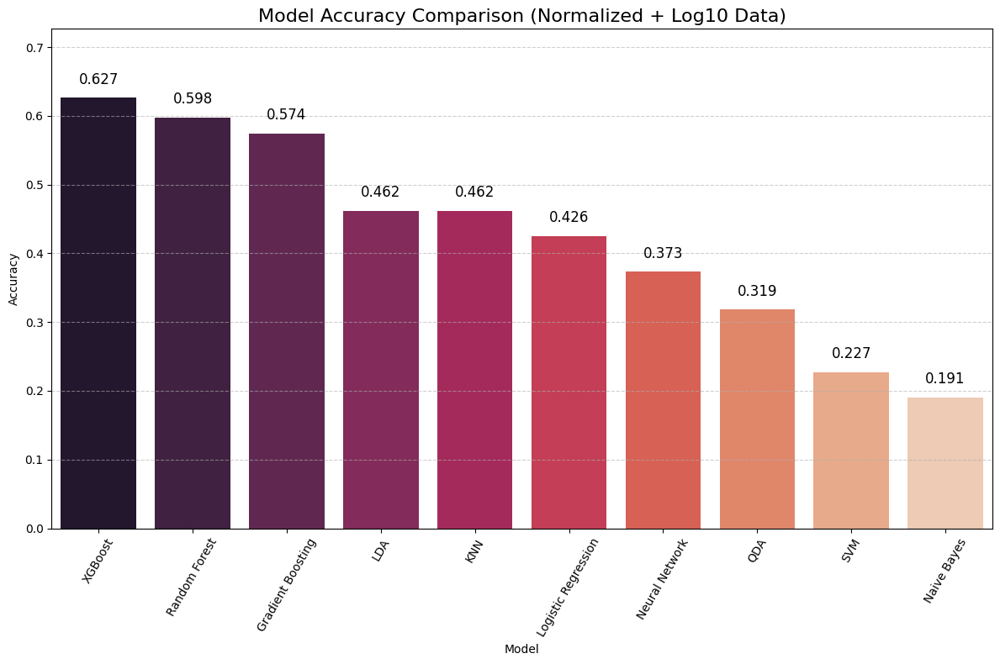

In [ ]:


# ===============================================================
# 16️⃣ Model Exploration
# ===============================================================
from sklearn import metrics, svm
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------------
# XGBoost
# ---------------------------------------------------------------
XGB_model = xgb.XGBClassifier(objective='multi:softmax', num_class=5, random_state=1234)
XGB_model.fit(X_train, y_train)
y_pred_XGB = XGB_model.predict(X_test)
Accuracy_XGB = metrics.accuracy_score(y_test, y_pred_XGB)
print("XGB Accuracy:", Accuracy_XGB)

# ---------------------------------------------------------------
# Gradient Boosting
# ---------------------------------------------------------------
GBT_model = GradientBoostingClassifier(random_state=123)
GBT_model.fit(X_train, y_train)
y_pred_GBT = GBT_model.predict(X_test)
Accuracy_GBT = metrics.accuracy_score(y_test, y_pred_GBT)
print("GBT Accuracy:", Accuracy_GBT)

# ---------------------------------------------------------------
# Random Forest
# ---------------------------------------------------------------
RF_model = RandomForestClassifier(random_state=1234)
RF_model.fit(X_train, y_train)
y_pred_RF = RF_model.predict(X_test)
Accuracy_RF = metrics.accuracy_score(y_test, y_pred_RF)
print("RF Accuracy:", Accuracy_RF)

# ---------------------------------------------------------------
# Support Vector Machine
# ---------------------------------------------------------------
SVC_model = svm.SVC(kernel='rbf', gamma=2, C=5, random_state=1234)
SVC_model.fit(X_train, y_train)
y_pred_SVM = SVC_model.predict(X_test)
Accuracy_SVM = metrics.accuracy_score(y_test, y_pred_SVM)
print("SVM Accuracy:", Accuracy_SVM)

# ---------------------------------------------------------------
# Neural Network
# ---------------------------------------------------------------
MLP_model = MLPClassifier(hidden_layer_sizes=(5,5,5), activation='logistic', solver='adam', max_iter=1500)
MLP_model.fit(X_train, y_train)
y_pred_MLP = MLP_model.predict(X_test)
Accuracy_MLP = metrics.accuracy_score(y_test, y_pred_MLP)
print("MLP Accuracy:", Accuracy_MLP)

# ---------------------------------------------------------------
# Naive Bayes
# ---------------------------------------------------------------
GNB_model = GaussianNB()
GNB_model.fit(X_train, y_train)
y_pred_GNB = GNB_model.predict(X_test)
Accuracy_GNB = metrics.accuracy_score(y_test, y_pred_GNB)
print("GNB Accuracy:", Accuracy_GNB)

# ---------------------------------------------------------------
# Linear & Quadratic Discriminant
# ---------------------------------------------------------------
LDA_model = LinearDiscriminantAnalysis()
LDA_model.fit(X_train, y_train)
y_pred_LDA = LDA_model.predict(X_test)
Accuracy_LDA = metrics.accuracy_score(y_test, y_pred_LDA)
print("LDA Accuracy:", Accuracy_LDA)

QDA_model = QuadraticDiscriminantAnalysis()
QDA_model.fit(X_train, y_train)
y_pred_QDA = QDA_model.predict(X_test)
Accuracy_QDA = metrics.accuracy_score(y_test, y_pred_QDA)
print("QDA Accuracy:", Accuracy_QDA)

# ---------------------------------------------------------------
# KNN
# ---------------------------------------------------------------
KNN_model = KNeighborsClassifier(n_neighbors=3)
KNN_model.fit(X_train, y_train)
y_pred_KNN = KNN_model.predict(X_test)
Accuracy_KNN = metrics.accuracy_score(y_test, y_pred_KNN)
print("KNN Accuracy:", Accuracy_KNN)

# ---------------------------------------------------------------
# Logistic Regression
# ---------------------------------------------------------------
LR_model = LogisticRegression(random_state=1234, multi_class='multinomial', solver='newton-cg')
LR_model.fit(X_train, y_train)
y_pred_LR = LR_model.predict(X_test)
Accuracy_LR = metrics.accuracy_score(y_test, y_pred_LR)
print("LR Accuracy:", Accuracy_LR)

# ===============================================================
# 17️⃣ Compare Results
# ===============================================================
accuracy_list = [
    Accuracy_XGB, Accuracy_GBT, Accuracy_RF, Accuracy_SVM, Accuracy_MLP,
    Accuracy_GNB, Accuracy_LDA, Accuracy_QDA, Accuracy_KNN, Accuracy_LR
]
model_list = [
    'XGBoost', 'Gradient Boosting', 'Random Forest', 'SVM',
    'Neural Network', 'Naive Bayes', 'LDA', 'QDA', 'KNN', 'Logistic Regression'
]

df_accuracy = pd.DataFrame({'Model': model_list, 'Accuracy': accuracy_list})
df_accuracy = df_accuracy.sort_values(by='Accuracy', ascending=False).reset_index(drop=True)

plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Model', y='Accuracy', data=df_accuracy, palette='rocket')

plt.title('Model Accuracy Comparison (Normalized + Log10 Data)', fontsize=16)
plt.xticks(rotation=60)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Add numbers on bars
for i, v in enumerate(df_accuracy["Accuracy"]):
    ax.text(i, v + 0.02, f"{v:.3f}", ha='center', fontsize=12, color='black')

plt.ylim(0, max(df_accuracy["Accuracy"]) + 0.1)
plt.tight_layout()
plt.show()


## Choose model
## For this different split method, the advantage of XGBoost model is more obvious

## Model tuning

Train shape: (727, 41)
Test shape: (383, 41)
Validation shape: (480, 41)
Unique labels: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]
Total combinations: 6561

✅ Best validation accuracy: 0.5958333333333333
✅ Best parameters:
   learning_rate = 0.05
   max_depth = 5
   min_child_weight = 1
   subsample = 0.6
   colsample_bytree = 1.0
   gamma = 0.1
   reg_lambda = 1.0
   reg_alpha = 0.1

=== 📊 Final Test Performance (2015) ===
Accuracy: 0.597911227154047
              precision    recall  f1-score   support

           0      0.375     0.250     0.300        12
           1      0.726     0.797     0.760       143
           2      0.481     0.587     0.529       109
           3      0.550     0.506     0.527        87
           4      0.800     0.125     0.216        32

    accuracy                          0.598       383
   macro avg      0.586     0.453     0.466       383
weighted avg      0.612     0.598     0.581       383



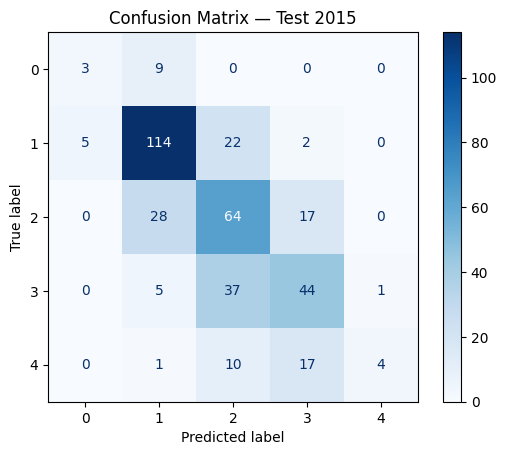


=== 📊 Validation Performance (2016) ===
Accuracy: 0.5958333333333333
              precision    recall  f1-score   support

           0      0.000     0.000     0.000         6
           1      0.672     0.737     0.703       175
           2      0.487     0.503     0.495       145
           3      0.629     0.634     0.632       123
           4      0.750     0.194     0.308        31

    accuracy                          0.596       480
   macro avg      0.508     0.414     0.427       480
weighted avg      0.602     0.596     0.588       480



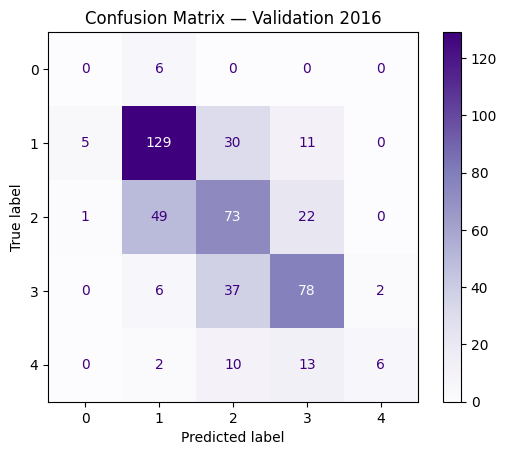

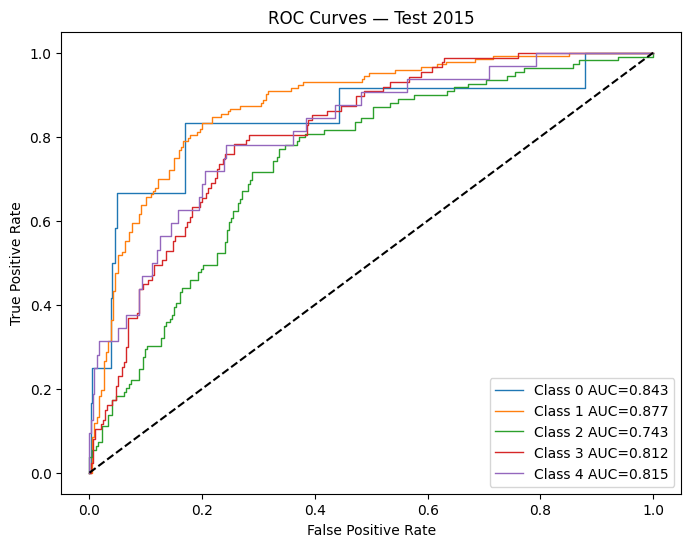

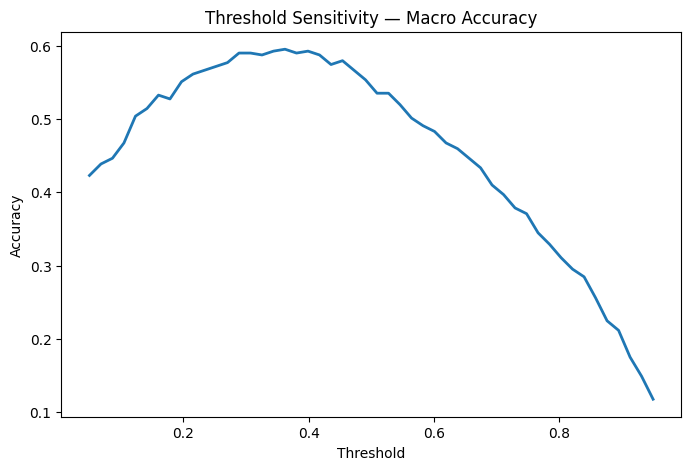


Best threshold = 0.36224489795918363


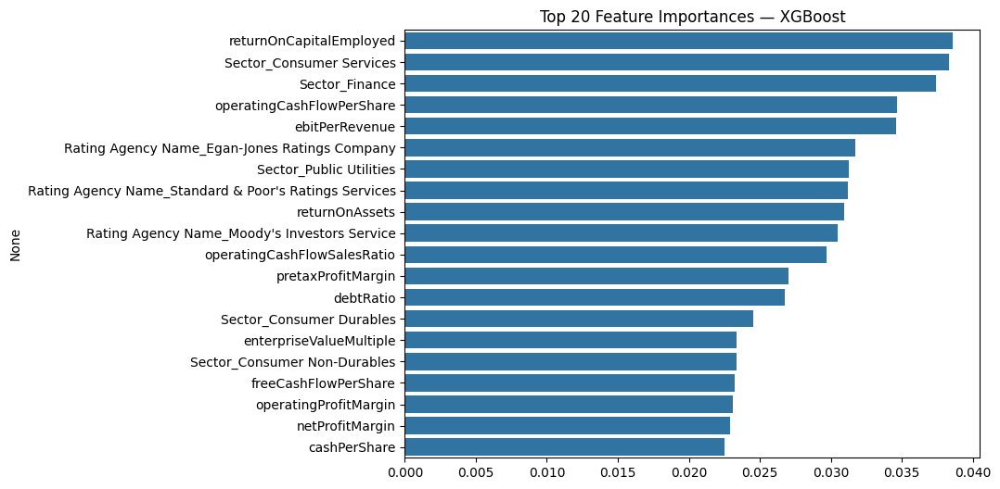

In [ ]:
# ===============================================================
# 🔧 XGBoost Hyperparameter Tuning — Full Report Version
# ===============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc,
    precision_recall_curve
)
from sklearn.preprocessing import label_binarize

# ---------------------------------------------------------------
# Check splits
# ---------------------------------------------------------------
print("Train shape:", X_train.shape)
print("Test shape:",  X_test.shape)
print("Validation shape:", X_val.shape)
print("Unique labels:", sorted(y_train.unique()))

# ===============================================================
# 1️⃣ Hyperparameter Grid
# ===============================================================
from itertools import product

param_grid = {
    "learning_rate":   [0.02, 0.05, 0.1],
    "max_depth":       [3, 4, 5],
    "min_child_weight":[1, 3, 5],
    "subsample":       [0.6, 0.8, 1.0],
    "colsample_bytree":[0.6, 0.8, 1.0],
    "gamma":           [0.0, 0.1, 0.3],
    "reg_lambda":      [0.1, 1.0, 5.0],
    "reg_alpha":       [0.0, 0.1, 0.5]
}

keys = list(param_grid.keys())
grid_combos = list(product(*[param_grid[k] for k in keys]))

print("Total combinations:", len(grid_combos))

# ===============================================================
# 2️⃣ Manual Validation Tuning (no early stopping)
# ===============================================================
best_params = None
best_val_acc = -np.inf
best_model = None

for combo in grid_combos:

    params = dict(zip(keys, combo))

    model = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=5,
        random_state=1234,
        n_estimators=350,     # safe fixed count
        eval_metric="mlogloss",
        **params
    )

    model.fit(X_train, y_train)

    y_val_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_val_pred)

    if acc > best_val_acc:
        best_val_acc = acc
        best_params = params
        best_model = model

print("\n✅ Best validation accuracy:", best_val_acc)
print("✅ Best parameters:")
for k, v in best_params.items():
    print("  ", k, "=", v)

# ===============================================================
# 3️⃣ Test Set Performance (Year 2015)
# ===============================================================
y_test_pred = best_model.predict(X_test)
y_test_prob = best_model.predict_proba(X_test)

print("\n=== 📊 Final Test Performance (2015) ===")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred, digits=3))

cm = confusion_matrix(y_test, y_test_pred)
ConfusionMatrixDisplay(cm).plot(cmap="Blues")
plt.title("Confusion Matrix — Test 2015")
plt.show()

# ===============================================================
# 4️⃣ Validation Performance (2016)
# ===============================================================
y_val_pred2 = best_model.predict(X_val)

print("\n=== 📊 Validation Performance (2016) ===")
print("Accuracy:", accuracy_score(y_val, y_val_pred2))
print(classification_report(y_val, y_val_pred2, digits=3))

cmv = confusion_matrix(y_val, y_val_pred2)
ConfusionMatrixDisplay(cmv).plot(cmap="Purples")
plt.title("Confusion Matrix — Validation 2016")
plt.show()

# ===============================================================
# 5️⃣ ROC–AUC (One-vs-Rest)
# ===============================================================
classes = np.sort(y_train.unique())
y_test_bin = label_binarize(y_test, classes=classes)

fpr, tpr, roc_auc = {}, {}, {}

for i, c in enumerate(classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8,6))
for i, c in enumerate(classes):
    plt.plot(fpr[i], tpr[i], lw=1, label=f"Class {c} AUC={roc_auc[i]:.3f}")

plt.plot([0,1],[0,1],'k--')
plt.title("ROC Curves — Test 2015")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

# ===============================================================
# 6️⃣ Threshold Analysis (macro-averaged)
# ===============================================================
thresholds = np.linspace(0.05, 0.95, 50)
macro_scores = []

for t in thresholds:
    pred_adj = np.argmax((y_test_prob >= t).astype(int), axis=1)
    macro_scores.append(accuracy_score(y_test, pred_adj))

plt.figure(figsize=(8,5))
plt.plot(thresholds, macro_scores, lw=2)
plt.title("Threshold Sensitivity — Macro Accuracy")
plt.xlabel("Threshold")
plt.ylabel("Accuracy")
plt.show()

best_t = thresholds[np.argmax(macro_scores)]
print("\nBest threshold =", best_t)

# ===============================================================
# 7️⃣ Feature Importance
# ===============================================================
fi = pd.Series(best_model.feature_importances_, index=X_train.columns)
fi = fi.sort_values(ascending=False).head(20)

plt.figure(figsize=(8,6))
sns.barplot(x=fi.values, y=fi.index)
plt.title("Top 20 Feature Importances — XGBoost")
plt.show()



Train major: (679, 41) {1: 266, 2: 265, 3: 148}
Test major: (339, 41) {1: 143, 2: 109, 3: 87}
Val major: (443, 41) {1: 175, 2: 145, 3: 123}
Total parameter combos: 256

✅ Best Validation Accuracy: 0.6433408577878104
✅ Best Params:
{'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8, 'colsample_bytree': 0.6, 'gamma': 0.1, 'reg_lambda': 0.1, 'reg_alpha': 0.0}

=== 📊 Final Test Performance (Major Classes Only) ===
Accuracy: 0.6607669616519174
              precision    recall  f1-score   support

           0      0.775     0.818     0.796       143
           1      0.508     0.578     0.541       109
           2      0.688     0.506     0.583        87

    accuracy                          0.661       339
   macro avg      0.657     0.634     0.640       339
weighted avg      0.667     0.661     0.659       339



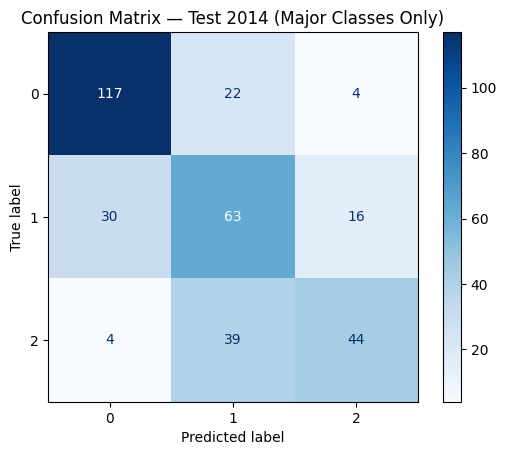

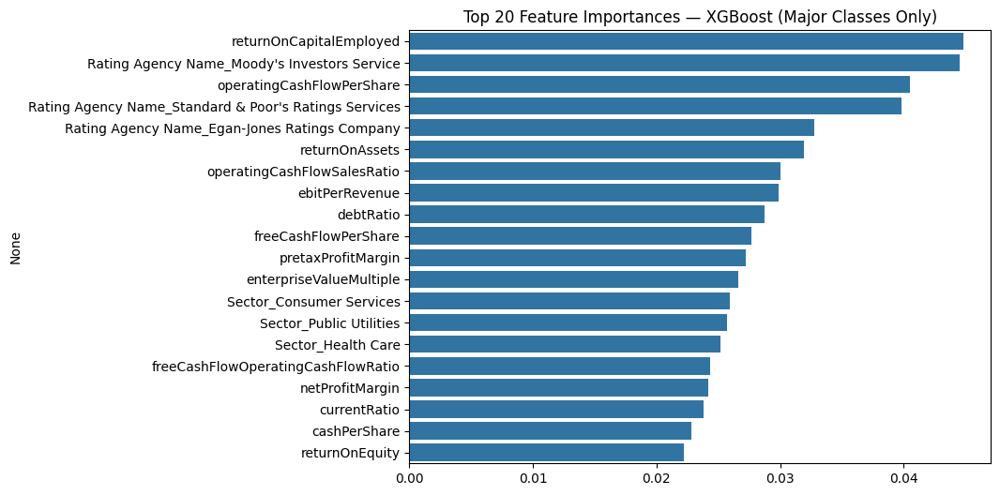

In [ ]:
# ===============================================================
# 🔄 0. Data Preprocessing + Year Split + Major-Class Filtering
# ===============================================================
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# -----------------------------
# Start from encoded dataset
# -----------------------------
df_model = df_encoded.copy()

# -----------------------------
# 1. Identify numerical columns
# -----------------------------
num_cols = df_model.select_dtypes(include=['float64', 'int64']).columns
num_cols = [c for c in num_cols if c not in ['Year', 'Risk_Level_num']]

# -----------------------------
# 2. MinMax normalization
# -----------------------------
scaler = MinMaxScaler()
df_model[num_cols] = scaler.fit_transform(df_model[num_cols])

# -----------------------------
# 3. log10 transform
# -----------------------------
df_model[num_cols] = np.log10(df_model[num_cols] + 1)

# -----------------------------
# 4. Target
# -----------------------------
y = df_model["Risk_Level_num"]

# -----------------------------
# 5. Keep only numeric features
# -----------------------------
X = df_model.select_dtypes(include=["float64", "int64", "bool"]).copy()
X = X.drop(columns=["Risk_Level_num"])

# -----------------------------
# 6. Year-based split
# -----------------------------
train_mask = (df_model["Year"] >= 2011) & (df_model["Year"] <= 2013)
test_mask  = (df_model["Year"] == 2014)
val_mask   = (df_model["Year"] == 2015)

X_train = X[train_mask].reset_index(drop=True)
y_train = y[train_mask].reset_index(drop=True)

X_test = X[test_mask].reset_index(drop=True)
y_test = y[test_mask].reset_index(drop=True)

X_val = X[val_mask].reset_index(drop=True)
y_val = y[val_mask].reset_index(drop=True)

# -----------------------------
# 7. Only keep major classes 1,2,3
# -----------------------------
major_classes = [1, 2, 3]

train_mask_big = y_train.isin(major_classes)
test_mask_big  = y_test.isin(major_classes)
val_mask_big   = y_val.isin(major_classes)

X_train_big = X_train[train_mask_big].reset_index(drop=True)
y_train_big = y_train[train_mask_big].reset_index(drop=True)

X_test_big = X_test[test_mask_big].reset_index(drop=True)
y_test_big = y_test[test_mask_big].reset_index(drop=True)

X_val_big = X_val[val_mask_big].reset_index(drop=True)
y_val_big = y_val[val_mask_big].reset_index(drop=True)

print("Train major:", X_train_big.shape, y_train_big.value_counts().to_dict())
print("Test major:",  X_test_big.shape, y_test_big.value_counts().to_dict())
print("Val major:",   X_val_big.shape,  y_val_big.value_counts().to_dict())
# ----------------------------------------------------
# 🔧 Map labels 1→0, 2→1, 3→2
# ----------------------------------------------------
label_map = {1: 0, 2: 1, 3: 2}

y_train_big = y_train_big.map(label_map)
y_test_big  = y_test_big.map(label_map)
y_val_big   = y_val_big.map(label_map)

# ---------------------------------------------------------------
# 🔧 1. XGBoost Hyperparameter Grid
# ---------------------------------------------------------------
from itertools import product
import xgboost as xgb

param_grid = {
    "learning_rate":   [0.02, 0.05],
    "max_depth":       [3, 4],
    "min_child_weight":[1, 3],
    "subsample":       [0.6, 0.8],
    "colsample_bytree":[0.6, 0.8],
    "gamma":           [0.0, 0.1],
    "reg_lambda":      [0.1, 1.0],
    "reg_alpha":       [0.0, 0.1]
}

keys = list(param_grid.keys())
grid_combos = list(product(*[param_grid[k] for k in keys]))
print("Total parameter combos:", len(grid_combos))

# ---------------------------------------------------------------
# 🔧 2. Manual Validation-Based Tuning (3 classes only)
# ---------------------------------------------------------------
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import seaborn as sns

best_params = None
best_val_acc = -np.inf
best_model = None

for combo in grid_combos:
    params = dict(zip(keys, combo))

    model = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=3,               # ⚠️ IMPORTANT: 3 classes only
        random_state=1234,
        n_estimators=350,
        eval_metric="mlogloss",
        **params
    )

    model.fit(X_train_big, y_train_big)
    val_pred = model.predict(X_val_big)
    acc = accuracy_score(y_val_big, val_pred)

    if acc > best_val_acc:
        best_val_acc = acc
        best_params = params
        best_model = model

print("\n✅ Best Validation Accuracy:", best_val_acc)
print("✅ Best Params:")
print(best_params)

# ---------------------------------------------------------------
# 🔧 3. Test Performance
# ---------------------------------------------------------------
test_pred = best_model.predict(X_test_big)

print("\n=== 📊 Final Test Performance (Major Classes Only) ===")
print("Accuracy:", accuracy_score(y_test_big, test_pred))
print(classification_report(y_test_big, test_pred, digits=3))

cm = confusion_matrix(y_test_big, test_pred)
ConfusionMatrixDisplay(cm).plot(cmap="Blues")
plt.title("Confusion Matrix — Test 2014 (Major Classes Only)")
plt.show()

# ---------------------------------------------------------------
# 🔧 4. Feature Importances
# ---------------------------------------------------------------
fi = pd.Series(best_model.feature_importances_, index=X_train_big.columns)
fi = fi.sort_values(ascending=False).head(20)

plt.figure(figsize=(8,6))
sns.barplot(x=fi.values, y=fi.index)
plt.title("Top 20 Feature Importances — XGBoost (Major Classes Only)")
plt.show()


## Output analysis
## The former training had a lower accuracy compare to the XGBoost models before tunning, the key reason is the imbalanced credit groups, with only 6 samples in group, the training results is influenced by this imbalanced distribution, with class weights, the model performance was limited by the small sample groups, but we still can see that after changing the train-test-validation split, the model performance improved overall, this is likely caused by the structure similarity of the new training data with the new test data. For the former splits, the test data has more structural difference with the training date.
## The above code we tried delete the two small sample groups and check the model performance, and the results proved our point, while dealing with more balanced groups, the model performance improved (from 0.59 accuracy to 0.66), and the tunning is not finished because right now the hyperparameters are on the edge case.
## Here we stops at this point, but with more time, the XGBoost model can be improved step by step by changing the hypterparameters' grid research range.